# AI-Powered Data Visualization: Dhaka Housing Prices Insights

**Project Objective:** To leverage AI and advanced data visualization techniques to explore a synthetic dataset representing the Dhaka housing market. This project aims to uncover patterns, predict property prices, and present insights through compelling and modern visualizations.

**Dataset:** A synthetically generated dataset for Dhaka, including features like property size, number of bedrooms/bathrooms, age, floor level, geospatial coordinates, categorical features like location type (e.g., 'Gulshan', 'Dhanmondi', 'Mirpur', 'Uttara') and property type, and a target variable: `Price_BDT_Lakhs`.

### 0. Setup & Environment Configuration

Importing necessary libraries, setting up the visual style for our plots, and defining the function to generate our synthetic Dhaka Housing dataset.

In [161]:
# Standard Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

# For Interactive Visualizations
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import folium # For maps

# Machine Learning
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestRegressor, IsolationForest
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

# Model Explainability
import shap # Make sure to install if not present: !pip install shap

# Settings
warnings.filterwarnings("ignore")
pd.set_option('display.max_columns', None)
pd.set_option('display.float_format', lambda x: '%.3f' % x) # Nicer float display

# --- Visual Style ---
# Apply a dark theme for modern, professional plots
plt.style.use('dark_background')
# Define a modern color palette for dark backgrounds
# Example: using a list of hex codes. Adjust as preferred.
# These are just examples, you can find many professional palettes online.
modern_palette_dark = ["#4ECCA3", "#232931", "#EEEEEE", "#FF5733", "#393E46", "#FFC300", "#DAF7A6"]
# For seaborn, you can also set a specific context and style
sns.set_context("notebook") # Options: paper, notebook, talk, poster
sns.set_palette(modern_palette_dark) # Set custom palette for seaborn
# For Plotly, we will set the template to 'plotly_dark'

print("Libraries imported and visual style configured.")
print(f"Matplotlib style: {plt.style.available}") # Show available styles
print(f"Using: 'dark_background'")

Libraries imported and visual style configured.
Matplotlib style: ['Solarize_Light2', '_classic_test_patch', '_mpl-gallery', '_mpl-gallery-nogrid', 'bmh', 'classic', 'dark_background', 'fast', 'fivethirtyeight', 'ggplot', 'grayscale', 'petroff10', 'seaborn-v0_8', 'seaborn-v0_8-bright', 'seaborn-v0_8-colorblind', 'seaborn-v0_8-dark', 'seaborn-v0_8-dark-palette', 'seaborn-v0_8-darkgrid', 'seaborn-v0_8-deep', 'seaborn-v0_8-muted', 'seaborn-v0_8-notebook', 'seaborn-v0_8-paper', 'seaborn-v0_8-pastel', 'seaborn-v0_8-poster', 'seaborn-v0_8-talk', 'seaborn-v0_8-ticks', 'seaborn-v0_8-white', 'seaborn-v0_8-whitegrid', 'tableau-colorblind10']
Using: 'dark_background'


In [162]:
# --- Synthetic Dhaka Housing Dataset Generation ---
def generate_dhaka_housing_data(num_samples=1500):
    """Generates a synthetic dataset for Dhaka housing."""
    np.random.seed(42) # for reproducibility

    # Dhaka-centric locations (approximate centers for some areas)
    locations_dhaka = {
        'Gulshan': {'lat': (23.7925, 0.005), 'lon': (90.4078, 0.005), 'price_factor': 2.5, 'amenity_factor': 0.9, 'dev_status': 'Prime Location'},
        'Banani': {'lat': (23.7920, 0.004), 'lon': (90.4040, 0.004), 'price_factor': 2.3, 'amenity_factor': 0.85, 'dev_status': 'Prime Location'},
        'Dhanmondi': {'lat': (23.7465, 0.008), 'lon': (90.3760, 0.008), 'price_factor': 2.0, 'amenity_factor': 0.8, 'dev_status': 'Established Residential'},
        'Baridhara': {'lat': (23.8100, 0.003), 'lon': (90.4180, 0.003), 'price_factor': 2.6, 'amenity_factor': 0.88, 'dev_status': 'Prime Location'},
        'Uttara': {'lat': (23.8750, 0.015), 'lon': (90.3850, 0.015), 'price_factor': 1.5, 'amenity_factor': 0.7, 'dev_status': 'Developing Suburb'},
        'Mirpur': {'lat': (23.8020, 0.012), 'lon': (90.3580, 0.012), 'price_factor': 1.0, 'amenity_factor': 0.6, 'dev_status': 'Populous Residential'},
        'Mohammadpur': {'lat': (23.7600, 0.007), 'lon': (90.3600, 0.007), 'price_factor': 1.3, 'amenity_factor': 0.65, 'dev_status': 'Established Residential'},
        'Bashundhara R/A': {'lat': (23.8150, 0.006), 'lon': (90.4250, 0.006), 'price_factor': 1.8, 'amenity_factor': 0.75, 'dev_status': 'Planned Residential'},
        'Old Dhaka': {'lat': (23.7100, 0.01), 'lon': (90.4070, 0.01), 'price_factor': 0.8, 'amenity_factor': 0.5, 'dev_status': 'Historic & Congested'}
    }
    location_names = list(locations_dhaka.keys())

    data = []
    for i in range(num_samples):
        loc_name = np.random.choice(location_names)
        loc_details = locations_dhaka[loc_name]

        lat = np.random.normal(loc_details['lat'][0], loc_details['lat'][1])
        lon = np.random.normal(loc_details['lon'][0], loc_details['lon'][1])

        area_sq_ft = np.random.randint(700, 4500)
        num_bedrooms = np.random.choice([2, 3, 4, 5], p=[0.2, 0.4, 0.3, 0.1])
        num_bathrooms = np.random.randint(max(1, num_bedrooms - 2), num_bedrooms + 1) # Bathrooms usually less than or equal to bedrooms
        age_of_property_years = np.random.randint(0, 35)
        floor_level = np.random.randint(1, np.random.choice([5, 10, 15, 20], p=[0.3,0.4,0.2,0.1])) # Max floor depends on building type

        # Categorical Features
        property_type = np.random.choice(['Apartment', 'Duplex', 'Penthouse', 'Standalone Floor'], p=[0.75, 0.10, 0.05, 0.10])
        lift_available = np.random.choice(['Yes', 'No'], p=[0.80 if floor_level > 3 else 0.3, 0.20 if floor_level > 3 else 0.7]) # Lift more likely in higher floors
        parking_space = np.random.choice(['Available', 'Not Available', 'Shared'], p=[0.6, 0.3, 0.1])

        # Numerical Features influenced by location
        proximity_to_main_road_km = abs(np.random.normal(0.5, 0.3 * (1/loc_details['amenity_factor']))) # Prime locations often closer
        proximity_to_main_road_km = max(0.05, proximity_to_main_road_km) # Ensure positive

        nearby_amenities_score = int(np.clip(np.random.normal(7, 2) * loc_details['amenity_factor'] * (1.2 if property_type == 'Penthouse' else 1), 1, 10))

        # Base price calculation (more sophisticated)
        base_price = 50  # Base price in Lakhs BDT
        price = base_price + \
                (area_sq_ft / 100) * (5 + num_bedrooms * 2) * loc_details['price_factor'] + \
                num_bedrooms * 15 * loc_details['price_factor'] + \
                num_bathrooms * 10 * loc_details['price_factor'] + \
                (5 - age_of_property_years / 10) * 5 * loc_details['price_factor'] + \
                (floor_level / 5) * 3 * (1 if lift_available == 'Yes' else 0.5) + \
                (10 if parking_space == 'Available' else 0) * loc_details['price_factor'] + \
                nearby_amenities_score * 5 * loc_details['price_factor'] + \
                (30 if property_type == 'Penthouse' else (15 if property_type == 'Duplex' else 0)) * loc_details['price_factor'] - \
                proximity_to_main_road_km * 20 * (1/loc_details['price_factor'])


        # Add some random noise
        price *= np.random.normal(1, 0.10)
        price = max(30, price) # Minimum price cap

        data.append([
            lat, lon, area_sq_ft, num_bedrooms, num_bathrooms,
            age_of_property_years, floor_level, property_type,
            lift_available, parking_space, proximity_to_main_road_km,
            nearby_amenities_score, loc_name, # loc_name is the location_type
            round(price, 2)
        ])

    df = pd.DataFrame(data, columns=[
        'Latitude', 'Longitude', 'Area_sq_ft', 'Num_Bedrooms',
        'Num_Bathrooms', 'Age_of_Property_years', 'Floor_Level',
        'Property_Type', 'Lift_Available', 'Parking_Space',
        'Proximity_to_Main_Road_km', 'Nearby_Amenities_Score',
        'Location_Name', 'Price_BDT_Lakhs'
    ])
    return df

print("Synthetic data generation function defined.")

Synthetic data generation function defined.


### 1. AI in Data Science & AI-Enhanced Data Analysis Concepts

**AI in Data Science:** Artificial Intelligence is revolutionizing data science by providing tools and techniques to extract deeper insights, automate complex tasks, and build predictive models with higher accuracy. It encompasses machine learning, deep learning, natural language processing, and computer vision, enabling data scientists to tackle problems previously considered intractable.

**AI-Enhanced Data Analysis Concepts:**
* **Automated Feature Engineering & Selection:** AI algorithms can automatically create new relevant features from existing data or select the most impactful features for modeling, reducing manual effort and potentially uncovering non-obvious relationships.
* **Advanced Pattern Recognition:** Machine learning models (e.g., clustering, anomaly detection) can identify subtle patterns, groupings, and outliers in high-dimensional data that might be missed by traditional statistical methods.
* **Predictive Modeling at Scale:** AI enables the development of sophisticated models that can predict future outcomes (like housing prices, customer churn) with greater precision and adapt to new data over time.
* **Explainable AI (XAI):** Techniques like SHAP and LIME help in understanding the "why" behind AI model predictions, making them more transparent and trustworthy, which is crucial for critical applications.
* **Generative AI for Data Augmentation:** AI can generate synthetic data that mimics real-world data, useful for augmenting small datasets, balancing classes, or testing model robustness.
* **Hyperparameter Optimization:** AI-driven techniques can efficiently search for the optimal hyperparameters for machine learning models, leading to better performance.

### 2. Practical Applications of AI in Housing & Real Estate

AI is increasingly applied in the real estate sector for:
* **Automated Valuation Models (AVMs):** Predicting property prices with higher accuracy than traditional methods by analyzing vast amounts of data.
* **Market Trend Analysis & Forecasting:** Identifying emerging market trends, hotspots, and future price movements.
* **Personalized Property Recommendations:** Matching buyers with properties based on their preferences and behavior, similar to recommendation engines in e-commerce.
* **Real Estate Investment Analysis:** Identifying lucrative investment opportunities by analyzing risk and return profiles of properties and locations.
* **Urban Planning and Development:** Assisting city planners in understanding housing demand, infrastructure needs, and optimizing urban development.
* **Automated Property Description Generation:** Using NLP to create engaging property listings.
* **Virtual Tours and Staging:** Using AR/VR and AI to create immersive property viewing experiences.

### 3. Data Loading and Initial Overview

Loading our synthetically generated Dhaka Housing dataset and performing an initial inspection.

In [163]:
df_housing = generate_dhaka_housing_data(num_samples=2000)

print("--- Dhaka Housing Dataset (First 5 Rows) ---")
display(df_housing.head())

--- Dhaka Housing Dataset (First 5 Rows) ---


,Latitude,Longitude,Area_sq_ft,Num_Bedrooms,Num_Bathrooms,Age_of_Property_years,Floor_Level,Property_Type,Lift_Available,Parking_Space,Proximity_to_Main_Road_km,Nearby_Amenities_Score,Location_Name,Price_BDT_Lakhs
0,23.756,90.364,1795,3,3,18,3,Penthouse,No,Not Available,0.283,6,Mohammadpur,476.380
1,23.796,90.329,2747,3,3,2,7,Apartment,Yes,Shared,0.802,3,Mirpur,441.080
2,23.812,90.415,4199,3,3,34,4,Apartment,Yes,Available,0.610,3,Baridhara,1196.260
3,23.807,90.420,1155,3,1,20,2,Apartment,No,Shared,0.558,3,Baridhara,640.750
4,23.792,90.406,1852,2,2,10,4,Apartment,Yes,Available,0.220,5,Gulshan,754.010


In [164]:
print("\n--- Dataset Information ---")
df_housing.info()


--- Dataset Information ---
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 14 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Latitude                   2000 non-null   float64
 1   Longitude                  2000 non-null   float64
 2   Area_sq_ft                 2000 non-null   int64  
 3   Num_Bedrooms               2000 non-null   int64  
 4   Num_Bathrooms              2000 non-null   int64  
 5   Age_of_Property_years      2000 non-null   int64  
 6   Floor_Level                2000 non-null   int64  
 7   Property_Type              2000 non-null   object 
 8   Lift_Available             2000 non-null   object 
 9   Parking_Space              2000 non-null   object 
 10  Proximity_to_Main_Road_km  2000 non-null   float64
 11  Nearby_Amenities_Score     2000 non-null   int64  
 12  Location_Name              2000 non-null   object 
 13  Price_BDT_Lakhs    

In [165]:
print("\n--- Descriptive Statistics (Numerical Features) ---")
display(df_housing.describe())


--- Descriptive Statistics (Numerical Features) ---


,Latitude,Longitude,Area_sq_ft,Num_Bedrooms,Num_Bathrooms,Age_of_Property_years,Floor_Level,Proximity_to_Main_Road_km,Nearby_Amenities_Score,Price_BDT_Lakhs
count,2000.000,2000.000,2000.000,2000.000,2000.000,2000.000,2000.000,2000.000,2000.000,2000.000
mean,23.790,90.393,2572.994,3.271,2.374,17.309,5.579,0.537,4.745,775.997
std,0.045,0.025,1101.615,0.888,1.078,10.064,4.089,0.358,1.835,376.706
min,23.685,90.321,700.000,2.000,1.000,0.000,1.000,0.050,1.000,145.340
25%,23.757,90.370,1635.500,3.000,2.000,9.000,2.000,0.251,3.000,488.455
50%,23.794,90.401,2554.500,3.000,2.000,17.000,4.000,0.492,5.000,703.055
75%,23.812,90.414,3546.000,4.000,3.000,26.000,8.000,0.756,6.000,999.717
max,23.914,90.442,4494.000,5.000,5.000,34.000,19.000,2.403,10.000,2439.800


In [166]:
print("\n--- Descriptive Statistics (Categorical Features) ---")
display(df_housing.describe(include=['object']))


--- Descriptive Statistics (Categorical Features) ---


,Property_Type,Lift_Available,Parking_Space,Location_Name
count,2000,2000,2000,2000
unique,4,2,3,9
top,Apartment,Yes,Available,Dhanmondi
freq,1520,1220,1149,235


In [167]:
# Custom function for a quick overview of data types and unique values
def custom_data_overview(df):
    overview = []
    for col in df.columns:
        dtype = df[col].dtype
        num_unique = df[col].nunique()
        null_values = df[col.strip()].isnull().sum()
        if dtype == 'object' or num_unique < 20: # Consider low-unique numerical as potentially categorical for overview
            col_type = 'Categorical'
            if num_unique < 10: # Show unique values if few
                 unique_vals = df[col].unique()
                 overview.append([col, dtype, col_type, num_unique, null_values, unique_vals[:5]]) # Show first 5 uniques
            else:
                 overview.append([col, dtype, col_type, num_unique, null_values, "Too many to list"])
        else:
            col_type = 'Numerical'
            overview.append([col, dtype, col_type, num_unique, null_values, "-"])

    overview_df = pd.DataFrame(overview, columns=['Feature', 'DataType', 'Type (Inferred)', 'Unique Values', 'Null Count', 'Example Uniques'])
    return overview_df

print("\n--- Custom Data Overview ---")
custom_overview_df = custom_data_overview(df_housing)
display(custom_overview_df)


--- Custom Data Overview ---


,Feature,DataType,Type (Inferred),Unique Values,Null Count,Example Uniques
0,Latitude,float64,Numerical,2000,0,-
1,Longitude,float64,Numerical,2000,0,-
2,Area_sq_ft,int64,Numerical,1572,0,-
3,Num_Bedrooms,int64,Categorical,4,0,"[3, 2, 4, 5]"
4,Num_Bathrooms,int64,Categorical,5,0,"[3, 1, 2, 4, 5]"
5,Age_of_Property_years,int64,Numerical,35,0,-
6,Floor_Level,int64,Categorical,19,0,Too many to list
7,Property_Type,object,Categorical,4,0,"[Penthouse, Apartment, Duplex, Standalone Floor]"
8,Lift_Available,object,Categorical,2,0,"[No, Yes]"
9,Parking_Space,object,Categorical,3,0,"[Not Available, Shared, Available]"


### 4. Exploratory Data Analysis (EDA)

Visually exploring the dataset to understand distributions, relationships, and identify potential patterns or anomalies. We'll use our dark theme and modern color palettes.

In [168]:
target_col = 'Price_BDT_Lakhs'

# --- Univariate Analysis: Numerical Features ---
numerical_features = df_housing.select_dtypes(include=np.number).columns.tolist()
numerical_features.remove(target_col) # Separate target for some plots
numerical_features.remove('Latitude') # Treat geo separately
numerical_features.remove('Longitude')

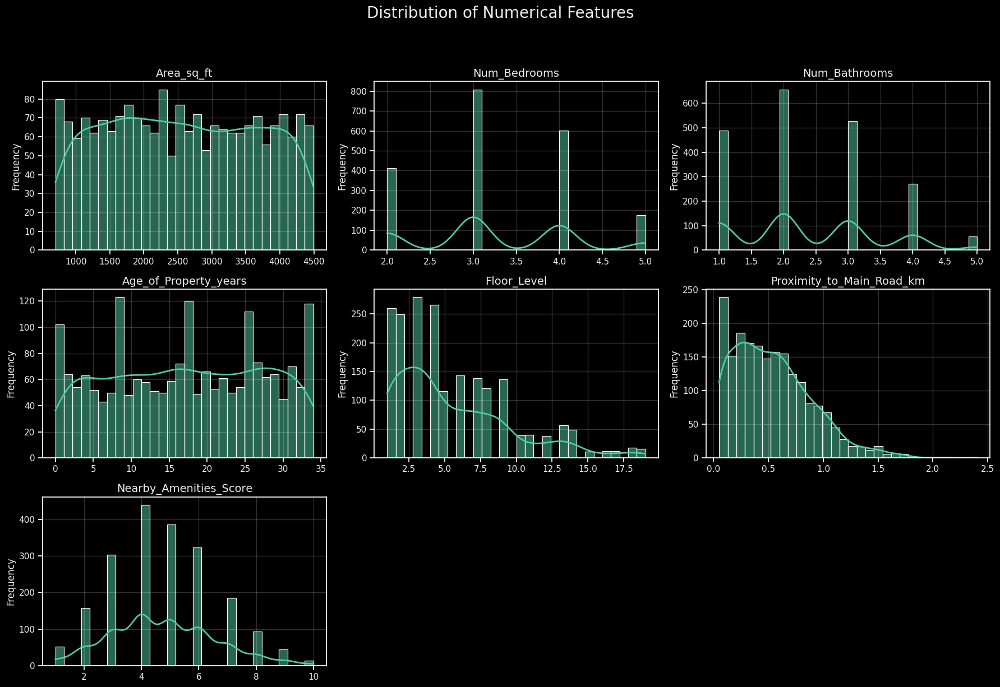

In [169]:
plt.figure(figsize=(18, 12)) # Larger figure for multiple subplots
plt.suptitle("Distribution of Numerical Features", fontsize=20, y=1.02, color=modern_palette_dark[2]) # Title color
for i, col in enumerate(numerical_features):
    plt.subplot(3, 3, i + 1) # Adjust grid as needed
    sns.histplot(df_housing[col], kde=True, color=modern_palette_dark[0], bins=30,
                 line_kws={'color': modern_palette_dark[3], 'lw': 2}) # KDE line color and width
    plt.title(col, fontsize=14, color=modern_palette_dark[2]) # Subplot title color
    plt.xlabel('') # Clean up x-labels for subplots
    plt.ylabel('Frequency', color=modern_palette_dark[2])
    plt.xticks(color=modern_palette_dark[2])
    plt.yticks(color=modern_palette_dark[2])
    plt.grid(alpha=0.2) # Lighter grid lines
plt.tight_layout(rect=[0, 0, 1, 0.98]) # Adjust layout to make space for suptitle
plt.show()

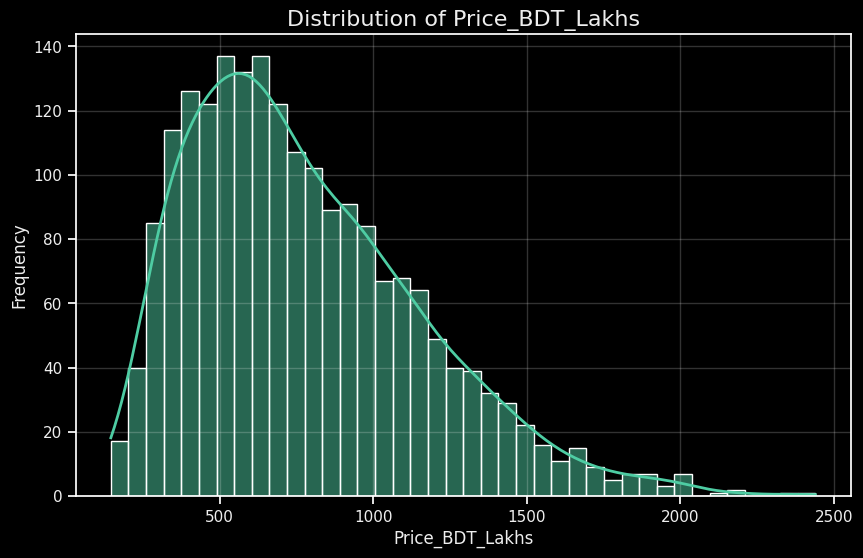

In [170]:
# Distribution of the Target Variable (Price)
plt.figure(figsize=(10, 6))
sns.histplot(df_housing[target_col], kde=True, color=modern_palette_dark[0], bins=40,
             line_kws={'color': modern_palette_dark[3], 'lw': 2})
plt.title(f'Distribution of {target_col}', fontsize=16, color=modern_palette_dark[2])
plt.xlabel(target_col, color=modern_palette_dark[2])
plt.ylabel('Frequency', color=modern_palette_dark[2])
plt.xticks(color=modern_palette_dark[2])
plt.yticks(color=modern_palette_dark[2])
plt.grid(alpha=0.2)
plt.show()

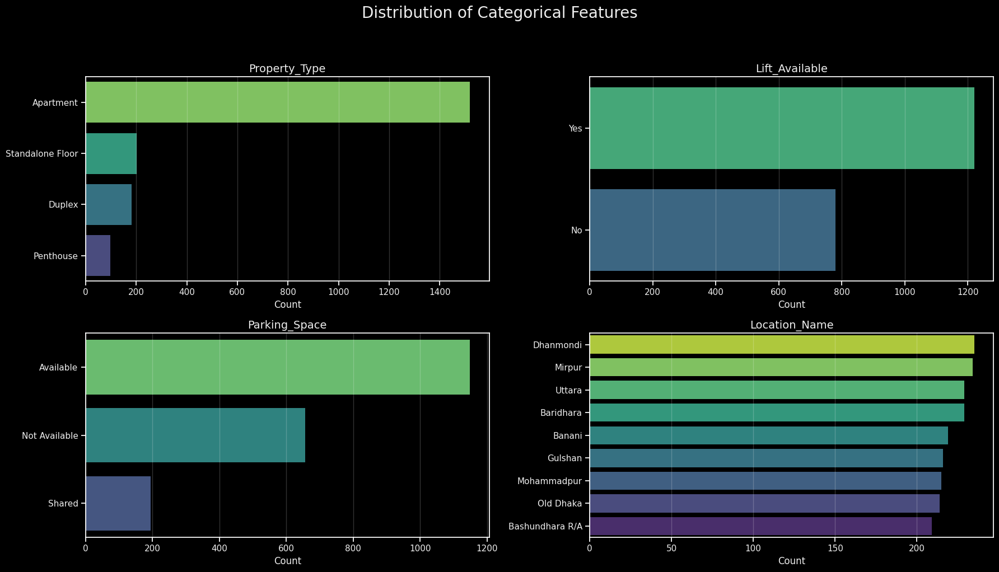

In [171]:
# --- Univariate Analysis: Categorical Features ---
categorical_features = df_housing.select_dtypes(include='object').columns.tolist()

plt.figure(figsize=(18, 10))
plt.suptitle("Distribution of Categorical Features", fontsize=20, y=1.02, color=modern_palette_dark[2])
for i, col in enumerate(categorical_features):
    plt.subplot(2, 2, i + 1) # Adjust grid based on number of categorical features
    order = df_housing[col].value_counts().index
    sns.countplot(data=df_housing, y=col, order=order, palette='viridis_r') # Using a reversed viridis palette
    plt.title(col, fontsize=14, color=modern_palette_dark[2])
    plt.xlabel('Count', color=modern_palette_dark[2])
    plt.ylabel('')
    plt.xticks(color=modern_palette_dark[2])
    plt.yticks(color=modern_palette_dark[2])
    plt.grid(axis='x', alpha=0.2)
plt.tight_layout(rect=[0, 0, 1, 0.98])
plt.show()

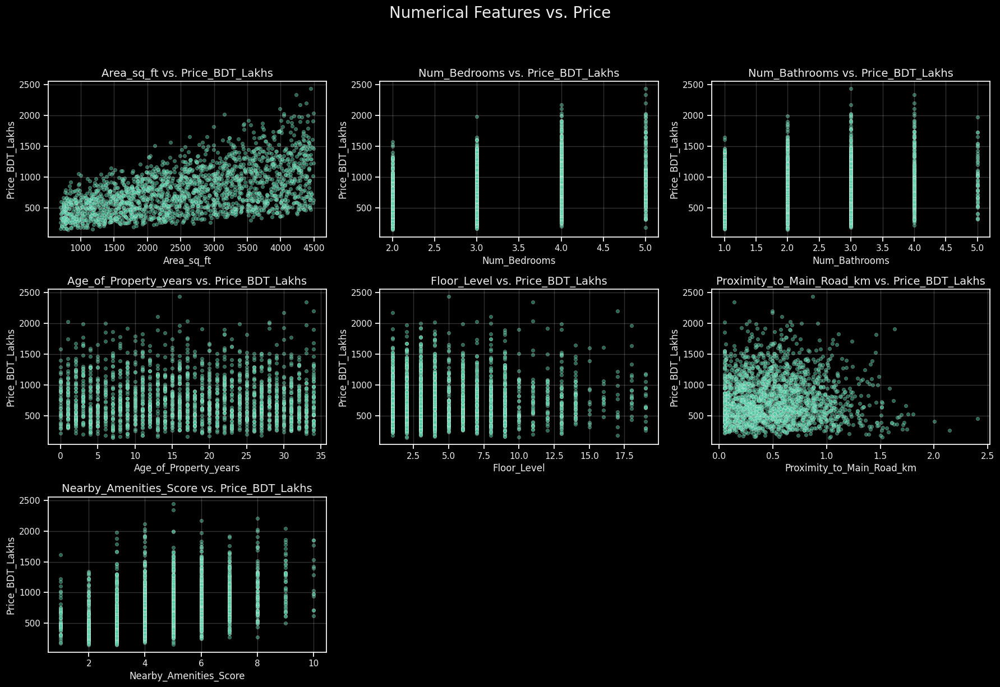

In [172]:
# --- Bivariate Analysis: Numerical Features vs. Target (Price) ---
plt.figure(figsize=(18, 12))
plt.suptitle("Numerical Features vs. Price", fontsize=20, y=1.02, color=modern_palette_dark[2])
for i, col in enumerate(numerical_features):
    plt.subplot(3, 3, i + 1)
    # Using a scatter plot with some transparency and smaller points for density
    sns.scatterplot(data=df_housing, x=col, y=target_col, color=modern_palette_dark[0], alpha=0.5, s=20)
    plt.title(f'{col} vs. {target_col}', fontsize=14, color=modern_palette_dark[2])
    plt.xlabel(col, color=modern_palette_dark[2])
    plt.ylabel(target_col, color=modern_palette_dark[2])
    plt.xticks(color=modern_palette_dark[2])
    plt.yticks(color=modern_palette_dark[2])
    plt.grid(alpha=0.2)
plt.tight_layout(rect=[0, 0, 1, 0.98])
plt.show()

In [173]:
# --- Bivariate Analysis: Categorical Features vs. Target (Price) ---
# Using Plotly for interactive box plots
fig = make_subplots(rows=2, cols=2, subplot_titles=categorical_features)
for i, col in enumerate(categorical_features):
    row, c = (i // 2) + 1, (i % 2) + 1
    box_fig = px.box(df_housing, x=col, y=target_col, color=col,
                     labels={target_col: 'Price (Lakh BDT)', col: col},
                     template='plotly_dark',
                     color_discrete_sequence=px.colors.qualitative.Pastel) # Using a pastel color sequence
    for trace in box_fig.data:
        fig.add_trace(trace, row=row, col=c)

fig.update_layout(height=1000, title_text="Categorical Features vs. Price (Interactive)", title_x=0.5,
                  showlegend=False) # Hiding legend as color is per category
fig.show()

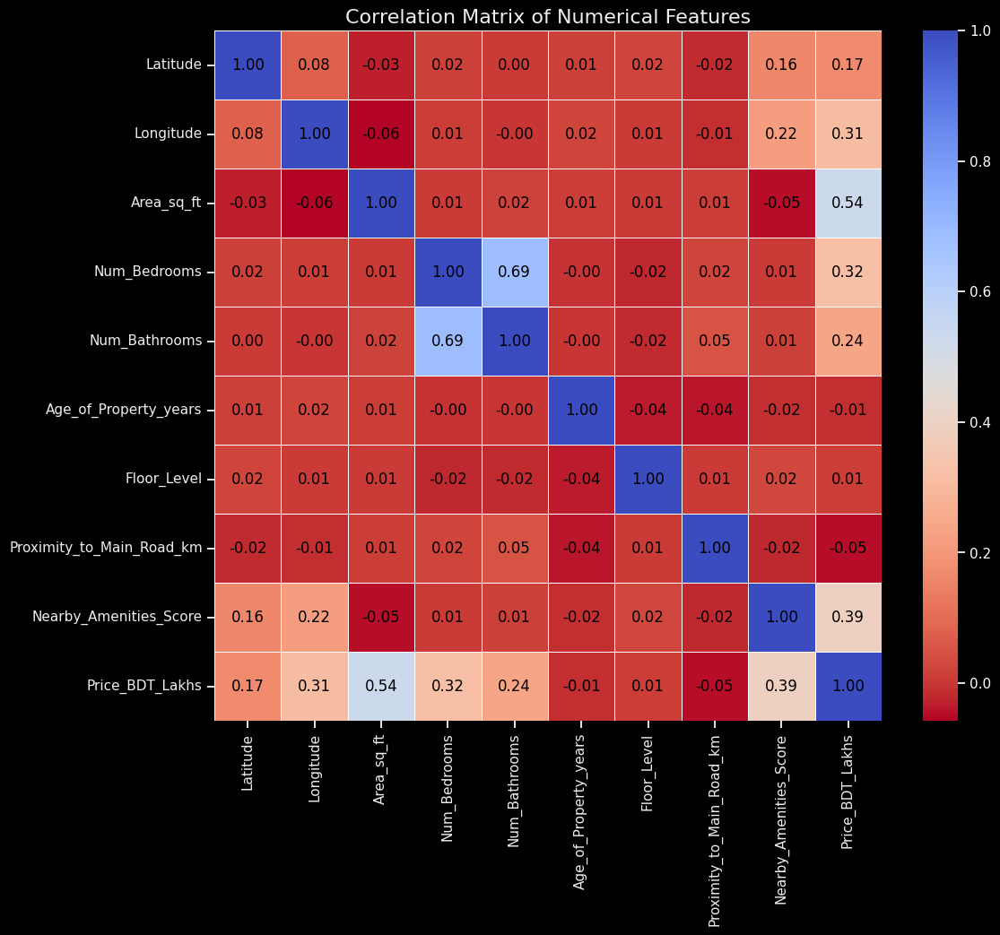

In [174]:
# --- Correlation Analysis ---
# Select only numerical columns for correlation matrix
numerical_df = df_housing.select_dtypes(include=np.number)

plt.figure(figsize=(12, 10))
correlation_matrix = numerical_df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm_r', fmt=".2f", linewidths=.5,
            annot_kws={"color": "black"}) # Changed cmap and annot_kws for better visibility on dark
plt.title('Correlation Matrix of Numerical Features', fontsize=16, color=modern_palette_dark[2])
plt.xticks(color=modern_palette_dark[2])
plt.yticks(color=modern_palette_dark[2])
plt.show()


### 5. Data Cleaning

Checking for missing values, duplicates, and potential outliers. Our synthetic data should be fairly clean, but these are standard checks.

In [175]:
print("--- Missing Value Check ---")
missing_values = df_housing.isnull().sum()
missing_df = missing_values[missing_values > 0].to_frame(name='Missing Count')
if not missing_df.empty:
    missing_df['Percentage (%)'] = (missing_df['Missing Count'] / len(df_housing)) * 100
    print(missing_df)
    # For demonstration, if there were missing values:
    # df_housing['Some_Column_With_NaNs'].fillna(df_housing['Some_Column_With_NaNs'].median(), inplace=True) # Numerical
    # df_housing['Some_Categorical_NaNs'].fillna(df_housing['Some_Categorical_NaNs'].mode()[0], inplace=True) # Categorical
else:
    print("No missing values found.")

--- Missing Value Check ---
No missing values found.


In [176]:
print("\n--- Duplicate Row Check ---")
duplicate_rows = df_housing.duplicated().sum()
if duplicate_rows > 0:
    print(f"Found {duplicate_rows} duplicate rows.")
    # df_housing.drop_duplicates(inplace=True)
else:
    print("No duplicate rows found.")


--- Duplicate Row Check ---
No duplicate rows found.


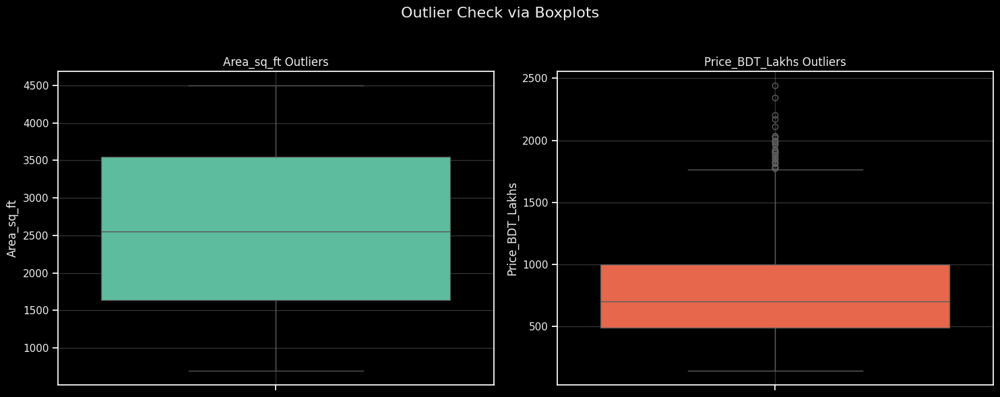

In [177]:
# --- Outlier Detection (Example using Boxplot for Area_sq_ft and Price) ---
plt.figure(figsize=(15, 6))
plt.suptitle("Outlier Check via Boxplots", fontsize=16, color=modern_palette_dark[2])

plt.subplot(1, 2, 1)
sns.boxplot(y=df_housing['Area_sq_ft'], color=modern_palette_dark[0], whis=1.5) # whis=1.5 for IQR rule
plt.title('Area_sq_ft Outliers', color=modern_palette_dark[2])
plt.ylabel('Area_sq_ft', color=modern_palette_dark[2])
plt.yticks(color=modern_palette_dark[2])
plt.grid(alpha=0.2)

plt.subplot(1, 2, 2)
sns.boxplot(y=df_housing[target_col], color=modern_palette_dark[3], whis=1.5)
plt.title(f'{target_col} Outliers', color=modern_palette_dark[2])
plt.ylabel(target_col, color=modern_palette_dark[2])
plt.yticks(color=modern_palette_dark[2])
plt.grid(alpha=0.2)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

In [178]:
# For this project, we'll proceed without aggressive outlier removal,
# but in a real scenario, outliers would be investigated and handled (e.g., capping, removal, transformation).
df_cleaned = df_housing.copy()

### 6. Data Transformation

Preparing data for machine learning: encoding categorical features and scaling numerical features.

In [179]:
# Identify feature types for preprocessing
numerical_cols_for_scaling = df_cleaned.select_dtypes(include=np.number).columns.tolist()
# Exclude target and geo from scaling if they are used directly later or handled differently
numerical_cols_for_scaling = [col for col in numerical_cols_for_scaling if col not in [target_col, 'Latitude', 'Longitude']]

categorical_cols_for_encoding = df_cleaned.select_dtypes(include='object').columns.tolist()

print(f"Numerical columns to scale: {numerical_cols_for_scaling}")
print(f"Categorical columns to encode: {categorical_cols_for_encoding}")

Numerical columns to scale: ['Area_sq_ft', 'Num_Bedrooms', 'Num_Bathrooms', 'Age_of_Property_years', 'Floor_Level', 'Proximity_to_Main_Road_km', 'Nearby_Amenities_Score']
Categorical columns to encode: ['Property_Type', 'Lift_Available', 'Parking_Space', 'Location_Name']


In [180]:
# Define preprocessor
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numerical_cols_for_scaling),
        ('cat', OneHotEncoder(handle_unknown='ignore', drop='first'), categorical_cols_for_encoding)
    ],
    remainder='passthrough' # Keep other columns (like target, lat, lon)
)

# Apply preprocessing
# For actual model training, we'd fit_transform on X_train and transform on X_test.
# Here, let's create a version of the feature set that IS transformed for some visualizations.
X = df_cleaned.drop(target_col, axis=1)
y = df_cleaned[target_col]

In [181]:
# Get column names after OneHotEncoding
# Fit preprocessor to get the transformer
temp_preprocessor_fitted = preprocessor.fit(X)
try:
    # Access the fitted OneHotEncoder to get feature names
    ohe_feature_names = temp_preprocessor_fitted.named_transformers_['cat'].get_feature_names_out(categorical_cols_for_encoding)
    # Combine with numerical and passthrough columns
    # Passthrough columns (if any besides target already dropped from X)
    passthrough_cols = [col for col in X.columns if col not in numerical_cols_for_scaling and col not in categorical_cols_for_encoding]
    transformed_feature_names = numerical_cols_for_scaling + list(ohe_feature_names) + passthrough_cols
except Exception as e:
    print(f"Could not get OHE feature names automatically: {e}. Falling back to generic names.")
    transformed_feature_names = None # Will handle this if it occurs.

In [182]:
X_processed_array = preprocessor.fit_transform(X)

# Convert X_processed_array to DataFrame (important for SHAP, inspection)
if transformed_feature_names:
    X_processed = pd.DataFrame(X_processed_array, columns=transformed_feature_names, index=X.index)
else: # Fallback if feature names couldn't be generated properly
    X_processed = pd.DataFrame(X_processed_array, index=X.index)
    print("Warning: Could not assign specific column names to the processed feature set after OHE.")


print("\n--- Shape of Processed Features (X_processed) ---")
print(X_processed.shape)

print("\n--- First 5 rows of Processed Features ---")
display(X_processed.head())

print("\n--- Target Variable (y) ---")
display(y.head())


--- Shape of Processed Features (X_processed) ---
(2000, 23)

--- First 5 rows of Processed Features ---


,Area_sq_ft,Num_Bedrooms,Num_Bathrooms,Age_of_Property_years,Floor_Level,Proximity_to_Main_Road_km,Nearby_Amenities_Score,Property_Type_Duplex,Property_Type_Penthouse,Property_Type_Standalone Floor,Lift_Available_Yes,Parking_Space_Not Available,Parking_Space_Shared,Location_Name_Baridhara,Location_Name_Bashundhara R/A,Location_Name_Dhanmondi,Location_Name_Gulshan,Location_Name_Mirpur,Location_Name_Mohammadpur,Location_Name_Old Dhaka,Location_Name_Uttara,Latitude,Longitude
0,-0.706,-0.305,0.580,0.069,-0.631,-0.707,0.684,0.000,1.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,23.756,90.364
1,0.158,-0.305,0.580,-1.522,0.348,0.739,-0.951,0.000,0.000,0.000,1.000,0.000,1.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,23.796,90.329
2,1.476,-0.305,0.580,1.659,-0.386,0.205,-0.951,0.000,0.000,0.000,1.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,23.812,90.415
3,-1.288,-0.305,-1.275,0.267,-0.875,0.061,-0.951,0.000,0.000,0.000,0.000,0.000,1.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,23.807,90.420
4,-0.655,-1.431,-0.347,-0.726,-0.386,-0.883,0.139,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,23.792,90.406



--- Target Variable (y) ---


,Price_BDT_Lakhs
0,476.380
1,441.080
2,1196.260
3,640.750
4,754.010


### 7. Summarization (Post-Transformation)

A brief look at the processed numerical features.

In [183]:
print("--- Descriptive Statistics of Scaled Numerical Features (from X_processed) ---")
# Select only the scaled numerical columns from X_processed for describe
# These are the original numerical_cols_for_scaling, as StandardScaler centers them around 0 with std dev 1
display(X_processed[numerical_cols_for_scaling].describe())

--- Descriptive Statistics of Scaled Numerical Features (from X_processed) ---


,Area_sq_ft,Num_Bedrooms,Num_Bathrooms,Age_of_Property_years,Floor_Level,Proximity_to_Main_Road_km,Nearby_Amenities_Score
count,2000.000,2000.000,2000.000,2000.000,2000.000,2000.000,2000.000
mean,-0.000,-0.000,0.000,-0.000,-0.000,-0.000,0.000
std,1.000,1.000,1.000,1.000,1.000,1.000,1.000
min,-1.701,-1.431,-1.275,-1.720,-1.120,-1.358,-2.042
25%,-0.851,-0.305,-0.347,-0.826,-0.875,-0.797,-0.951
50%,-0.017,-0.305,-0.347,-0.031,-0.386,-0.125,0.139
75%,0.883,0.822,0.580,0.864,0.592,0.611,0.684
max,1.744,1.948,2.435,1.659,3.283,5.209,2.864


### 8. Data Visualization (Advanced & Thematic)

This is where we leverage our processed data and AI techniques for richer visualizations.

#### 8.1 Creating Interactive Charts (Plotly & Folium) with Anomaly Detection

In [184]:
# --- Feature Engineering for Anomaly Detection ---
# We'll use a mix of numerical and encoded categorical features
df_anomaly = df_housing.copy()

In [185]:
# One-hot encode categorical features relevant to price
categorical_anomaly_features = ['Property_Type', 'Lift_Available', 'Parking_Space', 'Location_Name']
df_anomaly_encoded = pd.get_dummies(df_anomaly, columns=categorical_anomaly_features, drop_first=True)

In [186]:
# Select features for anomaly detection
anomaly_features_selected = [
    'Area_sq_ft', 'Num_Bedrooms', 'Num_Bathrooms', 'Age_of_Property_years',
    'Floor_Level', 'Proximity_to_Main_Road_km', 'Nearby_Amenities_Score',
    target_col # Include price itself as a key feature for price anomaly
]

In [187]:
# Add the encoded categorical feature names
encoded_cols = [col for col in df_anomaly_encoded.columns if any(cat_feat in col for cat_feat in categorical_anomaly_features)]
anomaly_features_selected.extend(encoded_cols)

X_anomaly = df_anomaly_encoded[anomaly_features_selected]

In [188]:
# Scale numerical features (important for some anomaly detection methods, though Isolation Forest is less sensitive)
numerical_anomaly_to_scale = [
    'Area_sq_ft', 'Num_Bedrooms', 'Num_Bathrooms', 'Age_of_Property_years',
    'Floor_Level', 'Proximity_to_Main_Road_km', 'Nearby_Amenities_Score', target_col
]
scaler_anomaly = StandardScaler()
X_anomaly_scaled_numerical = scaler_anomaly.fit_transform(X_anomaly[numerical_anomaly_to_scale])
X_anomaly_scaled_df = pd.DataFrame(X_anomaly_scaled_numerical, columns=numerical_anomaly_to_scale, index=X_anomaly.index)

In [189]:
# Combine scaled numerical with one-hot encoded categorical
X_anomaly_final = pd.concat([X_anomaly_scaled_df, X_anomaly.drop(columns=numerical_anomaly_to_scale)], axis=1)

In [190]:
# --- Isolation Forest for Anomaly Detection ---
# Contamination can be set based on domain knowledge or estimated (e.g., 'auto' or a small percentage like 0.01 to 0.05)
iso_forest = IsolationForest(n_estimators=100, contamination=0.03, random_state=42)
df_anomaly['Anomaly'] = iso_forest.fit_predict(X_anomaly_final)
df_anomaly['Anomaly_Score'] = iso_forest.decision_function(X_anomaly_final)

# Anomalies are -1, normal are 1. Convert to 1 for anomaly, 0 for normal for easier interpretation
df_anomaly['Is_Anomaly_Flag'] = df_anomaly['Anomaly'].apply(lambda x: 1 if x == -1 else 0)

print(f"\n--- Detected Anomalies ({df_anomaly['Is_Anomaly_Flag'].sum()} properties) ---")
display(df_anomaly[df_anomaly['Is_Anomaly_Flag'] == 1][[
    'Location_Name', 'Area_sq_ft', 'Num_Bedrooms', 'Property_Type', target_col, 'Anomaly_Score'
]].sort_values(by='Anomaly_Score').head(10)) # Show top 10 anomalies by score



--- Detected Anomalies (60 properties) ---


,Location_Name,Area_sq_ft,Num_Bedrooms,Property_Type,Price_BDT_Lakhs,Anomaly_Score
604,Gulshan,999,5,Penthouse,1031.540,-0.057
724,Old Dhaka,1388,5,Standalone Floor,335.200,-0.041
1653,Mohammadpur,1098,2,Standalone Floor,237.210,-0.037
618,Mirpur,811,5,Apartment,321.320,-0.036
1463,Gulshan,4384,5,Apartment,2201.480,-0.036
1812,Mirpur,3039,5,Duplex,720.290,-0.030
1623,Mirpur,4484,5,Penthouse,1020.590,-0.027
1562,Bashundhara R/A,4318,5,Penthouse,1975.950,-0.026
913,Uttara,3016,5,Penthouse,1020.700,-0.025
1883,Dhanmondi,4275,2,Apartment,1137.530,-0.024


In [191]:
# --- Interactive Scatter Plot with Plotly ---
# Comparing Area vs. Price, colored by Location_Name (a key categorical feature)
fig_plotly_scatter = px.scatter(
    df_cleaned,
    x='Area_sq_ft',
    y=target_col,
    color='Location_Name',
    size='Num_Bedrooms',  # Size bubbles by number of bedrooms
    hover_data=['Property_Type', 'Age_of_Property_years', 'Lift_Available'],
    template='plotly_dark', # Using Plotly's dark theme
    color_discrete_sequence=px.colors.qualitative.Vivid, # A vivid palette
    title='Interactive: Area vs. Price by Location (Dhaka Housing)'
)
fig_plotly_scatter.update_layout(
    title_font_color=modern_palette_dark[2],
    legend_title_font_color=modern_palette_dark[2],
    font_color=modern_palette_dark[2]
)
fig_plotly_scatter.show()

In [192]:
# --- Geospatial Visualization with Plotly Colors for Theme Consistency ---
# Define a color map for Plotly-like colors
dhaka_center = [23.8103, 90.4125]
plotly_colors_map = {
    0: modern_palette_dark[0],  # Normal (e.g., Greenish)
    1: modern_palette_dark[3]   # Anomaly (e.g., Reddish/Orange)
}

dhaka_map_outliers_interactive_plotly_colors = folium.Map(
    location=dhaka_center,
    zoom_start=11,
    tiles="CartoDB dark_matter" # Using a dark theme tile
)

# Add property points
for idx, row in df_anomaly.iterrows():
    color = plotly_colors_map[row['Is_Anomaly_Flag']]
    radius = 8 if row['Is_Anomaly_Flag'] == 1 else 4
    opacity = 0.9 if row['Is_Anomaly_Flag'] == 1 else 0.6

    tooltip_text = (f"<b>Price:</b> {row[target_col]} Lakh BDT<br>"
                  f"<b>Location:</b> {row['Location_Name']}<br>"
                  f"<b>Area:</b> {row['Area_sq_ft']} sq.ft<br>"
                  f"<b>Beds:</b> {row['Num_Bedrooms']}, Baths: {row['Num_Bathrooms']}<br>"
                  f"<b>Type:</b> {row['Property_Type']}<br>"
                  f"<b>Anomaly Score:</b> {row['Anomaly_Score']:.2f}")

    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=radius,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=opacity,
        tooltip=folium.Tooltip(tooltip_text) # Changed from popup to tooltip for hover
    ).add_to(dhaka_map_outliers_interactive_plotly_colors)

print("\n--- Geospatial Anomaly Map (Interactive with Hover Tooltips & Plotly-like Colors) ---")
# To display in Colab or save to HTML
# dhaka_map_outliers_interactive_plotly_colors.save("dhaka_outliers_map_interactive.html")
display(dhaka_map_outliers_interactive_plotly_colors)


--- Geospatial Anomaly Map (Interactive with Hover Tooltips & Plotly-like Colors) ---


In [193]:
# --- Interactive Map of Dhaka Housing Prices using Folium ---
print("\n--- Generating Interactive Property Map (Folium) ---")
# Create a base map centered on Dhaka
map_dhaka = folium.Map(location=[23.8103, 90.4125], zoom_start=11.5, tiles="CartoDB dark_matter") # Using a dark tile

# Add markers for properties
# To avoid too many markers for performance, let's sample or use a subset for map
df_sample_map = df_cleaned.sample(n=500, random_state=42) # Sample 500 properties

# Create a feature group for the properties
property_group = folium.FeatureGroup(name="Dhaka Properties")

for idx, row in df_sample_map.iterrows():
    # Create a more informative popup
    popup_html = f"""
    <b>Price:</b> {row[target_col]:.2f} Lakh BDT<br>
    <b>Location:</b> {row['Location_Name']}<br>
    <b>Area:</b> {row['Area_sq_ft']} sq.ft<br>
    <b>Type:</b> {row['Property_Type']}<br>
    <b>Beds:</b> {row['Num_Bedrooms']}, Baths: {row['Num_Bathrooms']}<br>
    <b>Lift:</b> {row['Lift_Available']}, Parking: {row['Parking_Space']}
    """
    iframe = folium.IFrame(popup_html, width=250, height=150)
    popup = folium.Popup(iframe, max_width=250)

    # Color marker by price range (simple example)
    price_val = row[target_col]
    if price_val < 100: color_marker = 'blue'
    elif price_val < 200: color_marker = 'green'
    elif price_val < 350: color_marker = 'orange'
    else: color_marker = 'red'

    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=5, # Smaller radius
        popup=popup,
        color=color_marker,
        fill=True,
        fill_color=color_marker,
        fill_opacity=0.7
    ).add_to(property_group)

property_group.add_to(map_dhaka)
folium.LayerControl().add_to(map_dhaka) # Add layer control

# Display the map (this will render in the notebook output)
display(map_dhaka)


--- Generating Interactive Property Map (Folium) ---


In [194]:
# --- Create Base Map ---
# Using Folium to create an interactive heatmap of predicted prices across Dhaka, overlaid with actual property locations and their true prices for comparison.
dhaka_map_heatmap = folium.Map(location=dhaka_center, zoom_start=11, tiles="CartoDB dark_matter")

# --- Add Heatmap Layer (Predicted Prices) ---
# For a heatmap, we typically need a measure of intensity at each point.
# We can use predicted prices. For a more continuous heatmap, Kernel Density Estimation on prices
# at given locations could be used, or simply plot points colored by price.
# Here, we'll create a list of [lat, lon, predicted_price] for the heatmap plugin.

# We need predictions for all data points in df_housing for a comprehensive heatmap
all_predictions = pipeline_rf.predict(df_housing.drop(columns=[target_col]))
df_housing['Predicted_Price_BDT_Lakhs'] = all_predictions

heat_data = [[row['Latitude'], row['Longitude'], row['Predicted_Price_BDT_Lakhs']] for index, row in df_housing.iterrows()]

from folium.plugins import HeatMap
HeatMap(heat_data, radius=15, blur=10).add_to(dhaka_map_heatmap)


# --- Add Actual Property Markers (Optional, can make map cluttered) ---
# For clarity, let's add only a subset or make them small, perhaps anomalies or high/low value properties
# Or, we can skip adding all individual markers if the heatmap is the focus.
# For this example, let's add anomalies again for context.
for idx, row in df_anomaly[df_anomaly['Is_Anomaly_Flag'] == 1].iterrows():
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=5,
        color='cyan', # Different color to distinguish from heatmap
        fill=True,
        fill_color='cyan',
        fill_opacity=0.7,
        tooltip=(f"<b>Anomaly!</b><br>"
                 f"<b>Actual Price:</b> {row[target_col]} Lakh BDT<br>"
                 f"<b>Predicted Price (from heatmap context):</b> {df_housing.loc[idx, 'Predicted_Price_BDT_Lakhs']:.2f} Lakh BDT<br>"
                 f"<b>Location:</b> {row['Location_Name']}")
    ).add_to(dhaka_map_heatmap)


print("\n--- Interactive Geospatial Price Heatmap (Predicted Prices) ---")
# To display in Colab or save to HTML
# dhaka_map_heatmap.save("dhaka_price_heatmap.html")
display(dhaka_map_heatmap)



--- Interactive Geospatial Price Heatmap (Predicted Prices) ---


#### 8.2 AI-Powered Visualizations

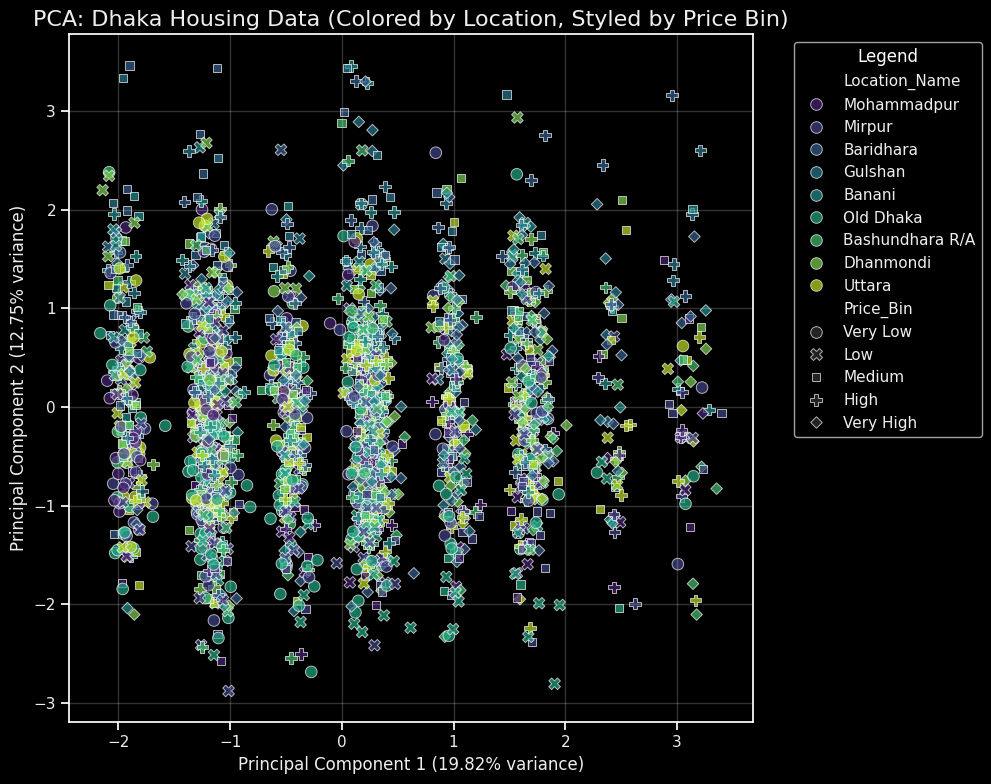

In [195]:
# --- Dimensionality Reduction (PCA) Visualization ---
# Use the processed data (X_processed) which has scaled numerical and OHE categorical features
# Ensure X_processed has enough features for PCA
if X_processed.shape[1] < 2:
    print("Not enough features for PCA (need at least 2). Skipping PCA plot.")
else:
    pca = PCA(n_components=2, random_state=42)
    X_pca = pca.fit_transform(X_processed)
    df_pca = pd.DataFrame(data=X_pca, columns=['PC1', 'PC2'], index=X_processed.index)

    # Add original categorical features or binned target for coloring
    df_pca['Location_Name'] = df_cleaned['Location_Name'] # Use original for interpretability
    # Create price bins for coloring
    df_pca['Price_Bin'] = pd.qcut(df_cleaned[target_col], q=5, labels=['Very Low', 'Low', 'Medium', 'High', 'Very High'], duplicates='drop')

    plt.figure(figsize=(12, 8))
    sns.scatterplot(
        data=df_pca, x='PC1', y='PC2', hue='Location_Name', style='Price_Bin',
        palette='viridis', s=70, alpha=0.7
    )
    plt.title('PCA: Dhaka Housing Data (Colored by Location, Styled by Price Bin)', fontsize=16, color=modern_palette_dark[2])
    plt.xlabel(f'Principal Component 1 ({pca.explained_variance_ratio_[0]:.2%} variance)', color=modern_palette_dark[2])
    plt.ylabel(f'Principal Component 2 ({pca.explained_variance_ratio_[1]:.2%} variance)', color=modern_palette_dark[2])
    plt.xticks(color=modern_palette_dark[2])
    plt.yticks(color=modern_palette_dark[2])
    plt.legend(title='Legend', bbox_to_anchor=(1.05, 1), loc='upper left', labelcolor=modern_palette_dark[2])
    plt.grid(alpha=0.2)
    plt.tight_layout(rect=[0, 0, 0.85, 1]) # Adjust for legend
    plt.show()

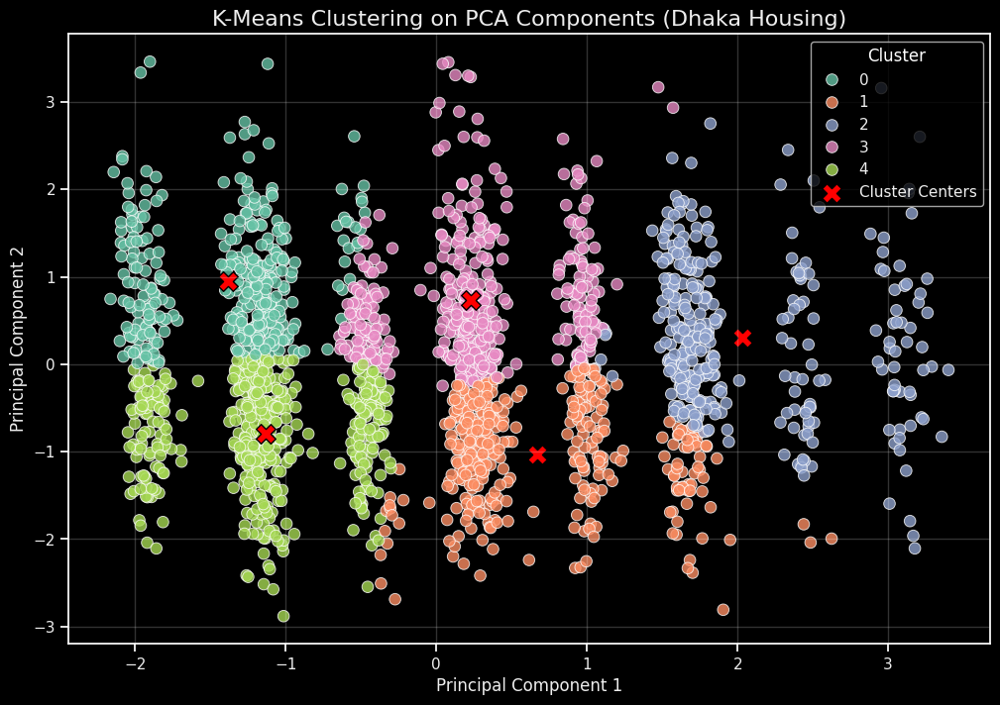


--- Mean Characteristics per PCA-based K-Means Cluster ---


,Area_sq_ft,Num_Bedrooms,Num_Bathrooms,Age_of_Property_years,Floor_Level,Proximity_to_Main_Road_km,Nearby_Amenities_Score,Price_BDT_Lakhs
Cluster_PCA_KMeans,,,,,,,,
0,2175.373,2.429,1.319,14.037,7.616,0.485,5.944,694.609
1,3120.322,3.668,2.884,20.478,3.763,0.598,3.480,804.653
2,2433.135,4.511,3.973,16.012,5.613,0.565,5.189,968.756
3,2191.359,3.441,2.545,15.197,7.033,0.510,5.612,816.280
4,2887.714,2.561,1.487,20.087,4.128,0.532,3.745,642.652


In [196]:
# --- Clustering (K-Means) Visualization ---
# Use PCA components for 2D visualization of clusters
if 'df_pca' in locals() and not df_pca.empty: # Check if PCA was run
    kmeans = KMeans(n_clusters=5, random_state=42, n_init='auto') # Let's try 5 clusters (e.g., for 5 price bins)
    df_pca['Cluster'] = kmeans.fit_predict(df_pca[['PC1', 'PC2']])

    plt.figure(figsize=(12, 8))
    sns.scatterplot(
        data=df_pca, x='PC1', y='PC2', hue='Cluster', palette='Set2', # A good categorical palette
        s=70, alpha=0.8
    )
    plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1],
                marker='X', s=200, color='red', label='Cluster Centers', edgecolors='black') # Plot centers
    plt.title('K-Means Clustering on PCA Components (Dhaka Housing)', fontsize=16, color=modern_palette_dark[2])
    plt.xlabel('Principal Component 1', color=modern_palette_dark[2])
    plt.ylabel('Principal Component 2', color=modern_palette_dark[2])
    plt.xticks(color=modern_palette_dark[2])
    plt.yticks(color=modern_palette_dark[2])
    plt.legend(title='Cluster', labelcolor=modern_palette_dark[2])
    plt.grid(alpha=0.2)
    plt.show()

    # Analyzing cluster characteristics (example)
    df_cleaned_with_clusters = df_cleaned.copy()
    df_cleaned_with_clusters['Cluster_PCA_KMeans'] = df_pca['Cluster']
    print("\n--- Mean Characteristics per PCA-based K-Means Cluster ---")
    cluster_summary_pca_kmeans = df_cleaned_with_clusters.groupby('Cluster_PCA_KMeans')[numerical_features + [target_col]].mean()
    display(cluster_summary_pca_kmeans)

else:
    print("PCA data not available, skipping K-Means on PCA components visualization.")

### 8.3 AI-Powered Customer Segmentation (Clustering)

Using K-Means clustering to identify distinct segments of properties based on numerical features.

In [197]:
# --- Data Preparation for Clustering ---
# Select features for clustering (numerical only for K-Means with standard scaling)
# Excluding Latitude and Longitude for now, as their raw values might not be ideal for K-Means without transformation
# or using a geo-aware clustering method. We'll focus on property characteristics.
cluster_features = ['Area_sq_ft', 'Num_Bedrooms', 'Num_Bathrooms', 'Age_of_Property_years', 'Floor_Level', 'Proximity_to_Main_Road_km', 'Nearby_Amenities_Score']
X_cluster = df_housing[cluster_features]

In [198]:
# Scale the features
scaler_cluster = StandardScaler()
X_cluster_scaled = scaler_cluster.fit_transform(X_cluster)

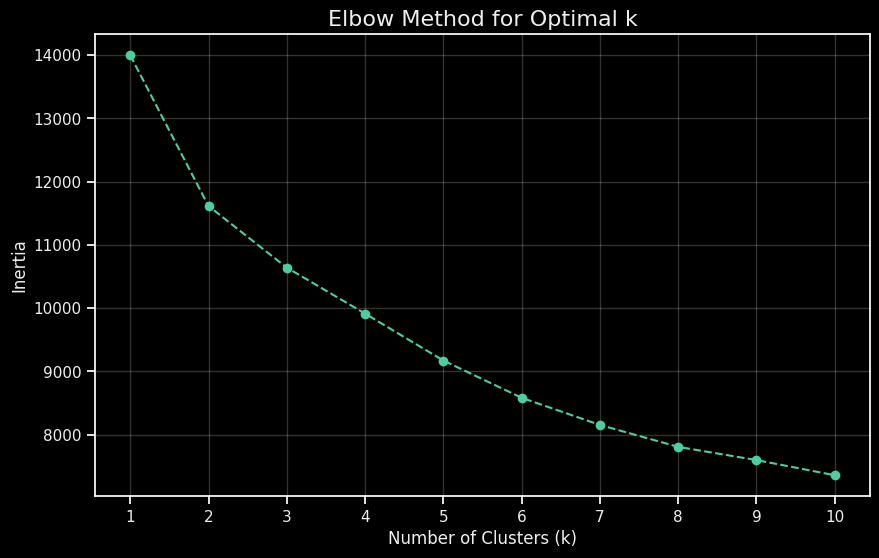

In [199]:
# --- Determining Optimal Number of Clusters (Elbow Method) ---
inertia = []
k_range = range(1, 11)
for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init='auto')
    kmeans.fit(X_cluster_scaled)
    inertia.append(kmeans.inertia_)

plt.figure(figsize=(10, 6))
plt.plot(k_range, inertia, marker='o', linestyle='--', color=modern_palette_dark[0])
plt.xlabel('Number of Clusters (k)', color=modern_palette_dark[2])
plt.ylabel('Inertia', color=modern_palette_dark[2])
plt.title('Elbow Method for Optimal k', fontsize=16, color=modern_palette_dark[2])
plt.xticks(k_range, color=modern_palette_dark[2])
plt.yticks(color=modern_palette_dark[2])
plt.grid(alpha=0.2)
plt.show()

In [200]:
# --- Apply K-Means Clustering ---
# Based on the elbow plot, let's choose k=4 (or another value if the elbow is clearer elsewhere)
optimal_k = 4
kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init='auto')
df_housing['Cluster'] = kmeans.fit_predict(X_cluster_scaled)

print(f"\n--- Properties per Cluster (Top 5 from Cluster 0) ---")
display(df_housing[df_housing['Cluster'] == 0].head())


--- Properties per Cluster (Top 5 from Cluster 0) ---


,Latitude,Longitude,Area_sq_ft,Num_Bedrooms,Num_Bathrooms,Age_of_Property_years,Floor_Level,Property_Type,Lift_Available,Parking_Space,Proximity_to_Main_Road_km,Nearby_Amenities_Score,Location_Name,Price_BDT_Lakhs,Predicted_Price_BDT_Lakhs,Cluster
0,23.756,90.364,1795,3,3,18,3,Penthouse,No,Not Available,0.283,6,Mohammadpur,476.380,465.567,0
4,23.792,90.406,1852,2,2,10,4,Apartment,Yes,Available,0.220,5,Gulshan,754.010,744.472,0
9,23.818,90.426,1341,3,3,31,19,Apartment,Yes,Available,0.327,8,Bashundhara R/A,635.030,573.773,0
25,23.810,90.420,2939,3,3,17,4,Apartment,No,Not Available,0.258,8,Baridhara,1177.540,1177.314,0
28,23.773,90.363,1450,2,2,16,3,Apartment,Yes,Available,0.230,4,Mohammadpur,380.500,370.210,0


In [201]:
# --- Analyze Cluster Characteristics ---
# Calculate mean values for each cluster
cluster_summary = df_housing.groupby('Cluster')[cluster_features + [target_col]].mean().reset_index()

print("\n--- Cluster Summary (Mean Values) ---")
display(cluster_summary)


--- Cluster Summary (Mean Values) ---


,Cluster,Area_sq_ft,Num_Bedrooms,Num_Bathrooms,Age_of_Property_years,Floor_Level,Proximity_to_Main_Road_km,Nearby_Amenities_Score,Price_BDT_Lakhs
0,0,2002.325,2.792,1.771,10.204,6.583,0.421,5.723,688.872
1,1,2556.414,2.920,1.933,26.821,4.577,0.401,4.512,704.743
2,2,3286.620,2.933,1.952,12.789,5.864,0.844,3.770,771.191
3,3,2545.047,4.330,3.708,17.169,5.512,0.544,4.877,932.585


In [202]:
# --- Visualization: Cluster Profiles (Radar Chart with Plotly) ---
# For radar chart, we need to scale the means for better comparison, or use raw means if scales are not too different
# Let's use the scaled means for the radar chart to compare profiles
cluster_summary_scaled_means = scaler_cluster.transform(cluster_summary[cluster_features])
df_cluster_summary_scaled = pd.DataFrame(cluster_summary_scaled_means, columns=cluster_features)
df_cluster_summary_scaled['Cluster'] = cluster_summary['Cluster']

fig_radar = go.Figure()
for i in range(optimal_k):
    fig_radar.add_trace(go.Scatterpolar(
        r=df_cluster_summary_scaled.loc[i, cluster_features].values.tolist() + [df_cluster_summary_scaled.loc[i, cluster_features].values[0]], # Add first value at end to close loop
        theta=cluster_features + [cluster_features[0]], # Add first feature at end
        fill='toself',
        name=f'Cluster {i}'
    ))

fig_radar.update_layout(
    polar=dict(
        radialaxis=dict(
            visible=True,
            range=[-2, 2] # Adjust range based on scaled data
        )),
    showlegend=True,
    title='Cluster Profiles (Scaled Mean Values)',
    template='plotly_dark'
)
fig_radar.show()

In [203]:
# --- Visualization: Scatter Plot with Clusters (PCA for 2D) ---
pca = PCA(n_components=2, random_state=42)
X_cluster_pca = pca.fit_transform(X_cluster_scaled)
df_housing['PCA1'] = X_cluster_pca[:, 0]
df_housing['PCA2'] = X_cluster_pca[:, 1]

fig_scatter_pca = px.scatter(df_housing, x='PCA1', y='PCA2', color='Cluster',
                             title='Property Segments (PCA-reduced)',
                             labels={'PCA1': 'Principal Component 1', 'PCA2': 'Principal Component 2'},
                             hover_data=['Location_Name', 'Price_BDT_Lakhs', 'Area_sq_ft'],
                             template='plotly_dark',
                             color_continuous_scale=px.colors.qualitative.Plotly) # Using a Plotly color scale
fig_scatter_pca.update_layout(coloraxis_colorbar=dict(title="Cluster"))
fig_scatter_pca.show()

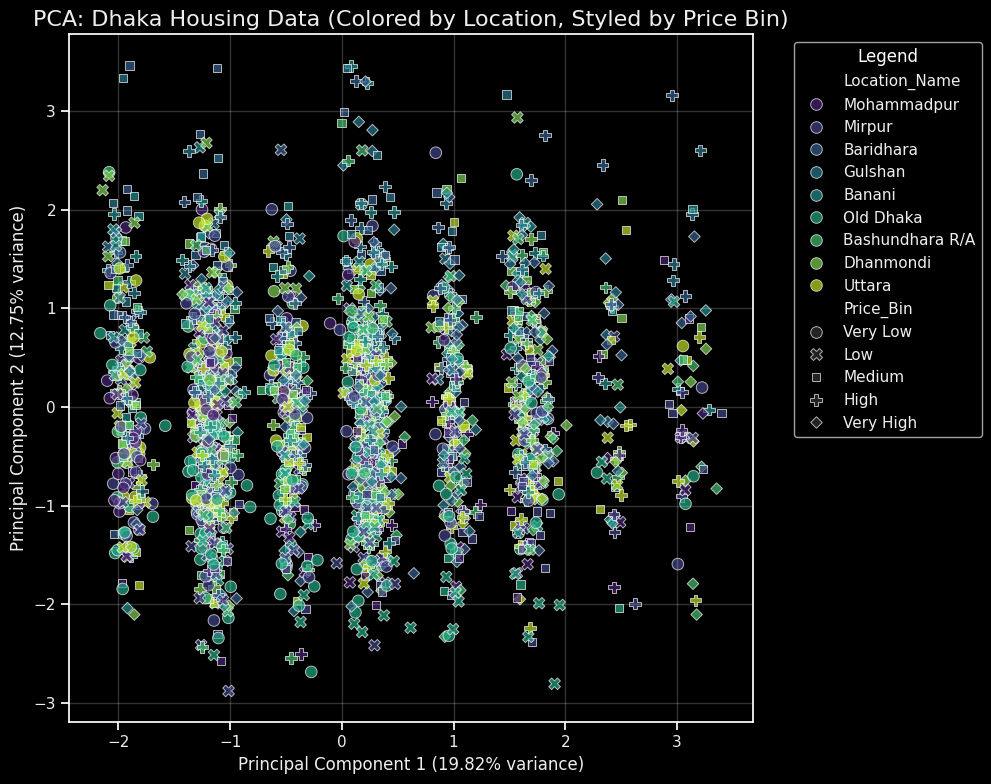

In [204]:
# --- Dimensionality Reduction (PCA) Visualization ---
# Use the processed data (X_processed) which has scaled numerical and OHE categorical features
# Ensure X_processed has enough features for PCA
if X_processed.shape[1] < 2:
    print("Not enough features for PCA (need at least 2). Skipping PCA plot.")
else:
    pca = PCA(n_components=2, random_state=42)
    X_pca = pca.fit_transform(X_processed)
    df_pca = pd.DataFrame(data=X_pca, columns=['PC1', 'PC2'], index=X_processed.index)

    # Add original categorical features or binned target for coloring
    df_pca['Location_Name'] = df_cleaned['Location_Name'] # Use original for interpretability
    # Create price bins for coloring
    df_pca['Price_Bin'] = pd.qcut(df_cleaned[target_col], q=5, labels=['Very Low', 'Low', 'Medium', 'High', 'Very High'], duplicates='drop')

    plt.figure(figsize=(12, 8))
    sns.scatterplot(
        data=df_pca, x='PC1', y='PC2', hue='Location_Name', style='Price_Bin',
        palette='viridis', s=70, alpha=0.7
    )
    plt.title('PCA: Dhaka Housing Data (Colored by Location, Styled by Price Bin)', fontsize=16, color=modern_palette_dark[2])
    plt.xlabel(f'Principal Component 1 ({pca.explained_variance_ratio_[0]:.2%} variance)', color=modern_palette_dark[2])
    plt.ylabel(f'Principal Component 2 ({pca.explained_variance_ratio_[1]:.2%} variance)', color=modern_palette_dark[2])
    plt.xticks(color=modern_palette_dark[2])
    plt.yticks(color=modern_palette_dark[2])
    plt.legend(title='Legend', bbox_to_anchor=(1.05, 1), loc='upper left', labelcolor=modern_palette_dark[2])
    plt.grid(alpha=0.2)
    plt.tight_layout(rect=[0, 0, 0.85, 1]) # Adjust for legend
    plt.show()

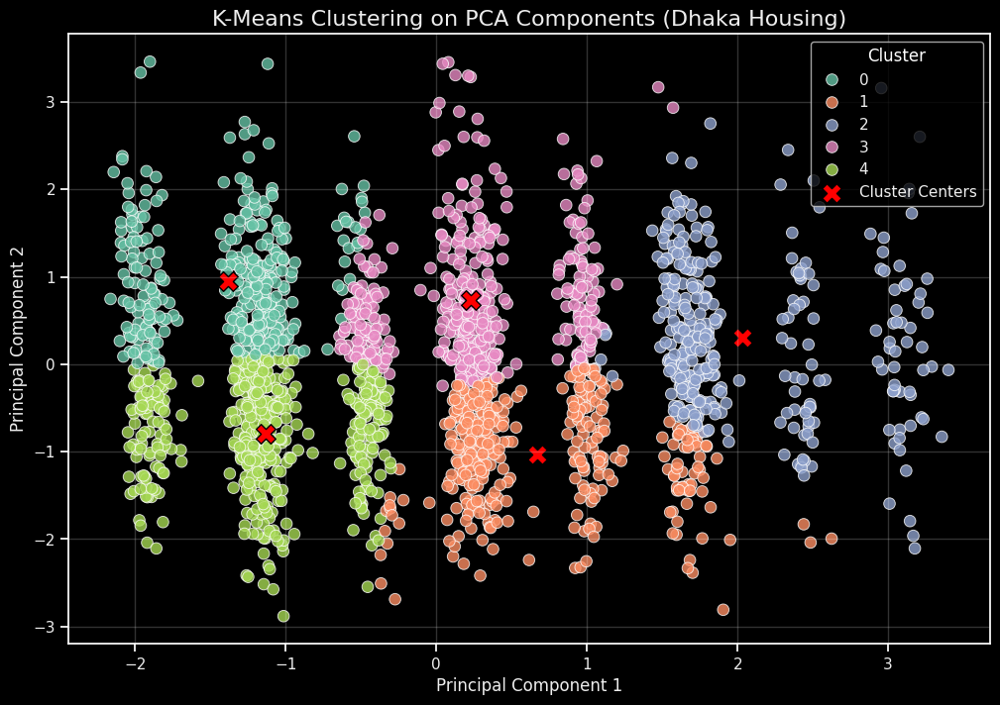


--- Mean Characteristics per PCA-based K-Means Cluster ---


,Area_sq_ft,Num_Bedrooms,Num_Bathrooms,Age_of_Property_years,Floor_Level,Proximity_to_Main_Road_km,Nearby_Amenities_Score,Price_BDT_Lakhs
Cluster_PCA_KMeans,,,,,,,,
0,2175.373,2.429,1.319,14.037,7.616,0.485,5.944,694.609
1,3120.322,3.668,2.884,20.478,3.763,0.598,3.480,804.653
2,2433.135,4.511,3.973,16.012,5.613,0.565,5.189,968.756
3,2191.359,3.441,2.545,15.197,7.033,0.510,5.612,816.280
4,2887.714,2.561,1.487,20.087,4.128,0.532,3.745,642.652


In [205]:
# --- Clustering (K-Means) Visualization ---
# Use PCA components for 2D visualization of clusters
if 'df_pca' in locals() and not df_pca.empty: # Check if PCA was run
    kmeans = KMeans(n_clusters=5, random_state=42, n_init='auto') # Let's try 5 clusters (e.g., for 5 price bins)
    df_pca['Cluster'] = kmeans.fit_predict(df_pca[['PC1', 'PC2']])

    plt.figure(figsize=(12, 8))
    sns.scatterplot(
        data=df_pca, x='PC1', y='PC2', hue='Cluster', palette='Set2', # A good categorical palette
        s=70, alpha=0.8
    )
    plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1],
                marker='X', s=200, color='red', label='Cluster Centers', edgecolors='black') # Plot centers
    plt.title('K-Means Clustering on PCA Components (Dhaka Housing)', fontsize=16, color=modern_palette_dark[2])
    plt.xlabel('Principal Component 1', color=modern_palette_dark[2])
    plt.ylabel('Principal Component 2', color=modern_palette_dark[2])
    plt.xticks(color=modern_palette_dark[2])
    plt.yticks(color=modern_palette_dark[2])
    plt.legend(title='Cluster', labelcolor=modern_palette_dark[2])
    plt.grid(alpha=0.2)
    plt.show()

     # Analyzing cluster characteristics (example)
    df_cleaned_with_clusters = df_cleaned.copy()
    df_cleaned_with_clusters['Cluster_PCA_KMeans'] = df_pca['Cluster']
    print("\n--- Mean Characteristics per PCA-based K-Means Cluster ---")
    cluster_summary_pca_kmeans = df_cleaned_with_clusters.groupby('Cluster_PCA_KMeans')[numerical_features + [target_col]].mean()
    display(cluster_summary_pca_kmeans)

else:
    print("PCA data not available, skipping K-Means on PCA components visualization.")

### 8.4 Machine Learning Model for AI-Driven Visualizations

We'll train a RandomForestRegressor to predict housing prices. The model itself is a tool here to generate insights we can visualize. Critically, we will evaluate its performance to understand the reliability of these AI-driven insights.

In [206]:
# --- Data Preparation for Prediction ---
# Define features (X) and target (y)
X = df_housing.drop(columns=[target_col, 'Cluster', 'PCA1', 'PCA2']) # Drop cluster/PCA columns
y = df_housing[target_col]

In [207]:
X

,Latitude,Longitude,Area_sq_ft,Num_Bedrooms,Num_Bathrooms,Age_of_Property_years,Floor_Level,Property_Type,Lift_Available,Parking_Space,Proximity_to_Main_Road_km,Nearby_Amenities_Score,Location_Name,Predicted_Price_BDT_Lakhs
0,23.756,90.364,1795,3,3,18,3,Penthouse,No,Not Available,0.283,6,Mohammadpur,465.567
1,23.796,90.329,2747,3,3,2,7,Apartment,Yes,Shared,0.802,3,Mirpur,450.409
2,23.812,90.415,4199,3,3,34,4,Apartment,Yes,Available,0.610,3,Baridhara,1293.545
3,23.807,90.420,1155,3,1,20,2,Apartment,No,Shared,0.558,3,Baridhara,608.795
4,23.792,90.406,1852,2,2,10,4,Apartment,Yes,Available,0.220,5,Gulshan,744.472
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,23.703,90.409,3332,4,3,30,1,Apartment,Yes,Not Available,0.280,4,Old Dhaka,461.218
1996,23.792,90.404,1021,2,1,9,9,Apartment,Yes,Available,0.130,6,Banani,485.293
1997,23.824,90.426,3861,5,5,12,2,Apartment,No,Not Available,1.425,5,Bashundhara R/A,1379.703
1998,23.868,90.377,4251,2,2,34,7,Apartment,Yes,Available,0.448,6,Uttara,797.387


In [208]:
y

,Price_BDT_Lakhs
0,476.380
1,441.080
2,1196.260
3,640.750
4,754.010
...,...
1995,434.360
1996,519.100
1997,1385.440
1998,818.400


In [209]:
# Identify numerical and categorical features for preprocessing
numerical_cols_model = X.select_dtypes(include=np.number).columns.tolist()
categorical_cols_model = X.select_dtypes(include='object').columns.tolist()

In [210]:
# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [211]:
print(f"Training set shape: X_train={X_train.shape}, y_train={y_train.shape}")
print(f"Test set shape: X_test={X_test.shape}, y_test={y_test.shape}")

Training set shape: X_train=(1600, 14), y_train=(1600,)
Test set shape: X_test=(400, 14), y_test=(400,)


In [212]:
# Feature Selection using RandomForest Importance

# --- Feature Selection using SelectFromModel ---
# We'll use a RandomForestRegressor to get feature importances and select features
# Create a temporary preprocessor for feature selection (only for fitting SelectFromModel)
temp_preprocessor_for_selection = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numerical_cols_model),
        ('cat', OneHotEncoder(handle_unknown='ignore', sparse_output=False), categorical_cols_model)
    ],
    remainder='passthrough' # Keep other columns if any (shouldn't be if cols are well-defined)
)

In [213]:
# Fit the temporary preprocessor and transform X_train to get feature names after OHE
X_train_processed_for_selection = temp_preprocessor_for_selection.fit_transform(X_train)
# Get feature names after one-hot encoding
ohe_feature_names = temp_preprocessor_for_selection.named_transformers_['cat'].get_feature_names_out(categorical_cols_model)
selected_numerical_cols = numerical_cols_model
# Combine all feature names
all_feature_names_for_selection = selected_numerical_cols + list(ohe_feature_names)

In [214]:
from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import RandomForestRegressor

# Initialize and fit SelectFromModel
# We use a RandomForestRegressor to determine feature importance
# The threshold='median' will select features with importance greater than the median importance
feature_selector = SelectFromModel(RandomForestRegressor(n_estimators=100, random_state=42, oob_score=True), threshold='median')
feature_selector.fit(X_train_processed_for_selection, y_train)

SelectFromModel(estimator=RandomForestRegressor(oob_score=True,
                                                random_state=42),
                threshold='median')

In [215]:
# --- Model Training (RandomForestRegressor) ---
# Apply the same preprocessing and feature selection to X_train as done in feature selection
X_train_processed_for_selection = temp_preprocessor_for_selection.transform(X_train) # Preprocess X_train
X_train_selected = feature_selector.transform(X_train_processed_for_selection) # Apply feature selection

model_rf = RandomForestRegressor(n_estimators=150, # Slightly more estimators
                                 random_state=42,
                                 n_jobs=-1,
                                 max_depth=20,       # Increased max_depth
                                 min_samples_split=4,# Adjusted min_samples
                                 min_samples_leaf=2,
                                 oob_score=True,
                                 max_features='sqrt') # Common practice for RF
model_rf.fit(X_train_selected, y_train) # Fit using selected features

RandomForestRegressor(max_depth=20, max_features='sqrt', min_samples_leaf=2,
                      min_samples_split=4, n_estimators=150, n_jobs=-1,
                      oob_score=True, random_state=42)

In [216]:
# Get the names of the selected features
selected_features_mask = feature_selector.get_support()
selected_features_names = [name for name, selected in zip(all_feature_names_for_selection, selected_features_mask) if selected]

print(f"--- Original number of features (after OHE): {len(all_feature_names_for_selection)} ---")
print(f"--- Number of features selected by SelectFromModel: {len(selected_features_names)} ---")
print("Selected features:", selected_features_names)

--- Original number of features (after OHE): 28 ---
--- Number of features selected by SelectFromModel: 14 ---
Selected features: ['Latitude', 'Longitude', 'Area_sq_ft', 'Num_Bedrooms', 'Num_Bathrooms', 'Age_of_Property_years', 'Floor_Level', 'Proximity_to_Main_Road_km', 'Nearby_Amenities_Score', 'Predicted_Price_BDT_Lakhs', 'Lift_Available_No', 'Parking_Space_Available', 'Parking_Space_Not Available', 'Location_Name_Banani']


In [217]:
# Now, we need to update numerical_cols_model and categorical_cols_model
# based on selected_features_names to be used in the main pipeline.
# This is a bit tricky because OHE expands categorical features.
# We'll identify which original features contributed to the selected OHE features.

final_numerical_cols_for_pipeline = [col for col in numerical_cols_model if col in selected_features_names]
final_categorical_cols_for_pipeline = []
for original_cat_col in categorical_cols_model:
    # Check if any of the OHE versions of this original column were selected
    if any(f_name.startswith(original_cat_col + "_") for f_name in selected_features_names):
        final_categorical_cols_for_pipeline.append(original_cat_col)

# If a numerical feature was scaled and then selected, it's in final_numerical_cols_for_pipeline.
# If an original categorical feature had at least one of its OHE versions selected, it's in final_categorical_cols_for_pipeline.

print("\n--- Final Original Numerical Features for Pipeline ---")
print(final_numerical_cols_for_pipeline)
print("\n--- Final Original Categorical Features for Pipeline ---")
print(final_categorical_cols_for_pipeline)


--- Final Original Numerical Features for Pipeline ---
['Latitude', 'Longitude', 'Area_sq_ft', 'Num_Bedrooms', 'Num_Bathrooms', 'Age_of_Property_years', 'Floor_Level', 'Proximity_to_Main_Road_km', 'Nearby_Amenities_Score', 'Predicted_Price_BDT_Lakhs']

--- Final Original Categorical Features for Pipeline ---
['Lift_Available', 'Parking_Space', 'Location_Name']


In [218]:
# --- Create Preprocessing Pipeline with Selected Features ---
# Numerical features transformer
numerical_transformer = StandardScaler()
# Categorical features transformer
categorical_transformer = OneHotEncoder(handle_unknown='ignore')

# Create preprocessor ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, final_numerical_cols_for_pipeline),
        ('cat', categorical_transformer, final_categorical_cols_for_pipeline)
    ],
    remainder='drop' # Drop columns not specified
)

In [219]:
# --- Define and Train the RandomForestRegressor Model ---
model_rf = RandomForestRegressor(n_estimators=100, random_state=42, oob_score=True,
                                 max_depth=20, min_samples_split=5, min_samples_leaf=2) # Added some common hyperparameters

In [220]:
# Create the full pipeline
pipeline_rf = Pipeline(steps=[('preprocessor', preprocessor),
                              ('regressor', model_rf)])

In [221]:
# Train the model
pipeline_rf.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num', StandardScaler(),
                                                  ['Latitude', 'Longitude',
                                                   'Area_sq_ft', 'Num_Bedrooms',
                                                   'Num_Bathrooms',
                                                   'Age_of_Property_years',
                                                   'Floor_Level',
                                                   'Proximity_to_Main_Road_km',
                                                   'Nearby_Amenities_Score',
                                                   'Predicted_Price_BDT_Lakhs']),
                                                 ('cat',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['Lift_Available',
                                                   'Parking_Space',
                                                   'Location_Name'])])),
                ('regressor',
                 RandomForestRegressor(max_depth=20, min_samples_leaf=2,
                                       min_samples_split=5, oob_score=True,
                                       random_state=42))])

In [222]:
# --- Make Predictions ---
y_pred_train = pipeline_rf.predict(X_train)
y_pred_test = pipeline_rf.predict(X_test)

In [223]:
# --- Model Performance Evaluation ---
y_pred_train = pipeline_rf.predict(X_train)
y_pred_test = pipeline_rf.predict(X_test)

In [224]:
# --- Evaluate Model Performance ---
# Get feature names after preprocessing for X_test (to calculate adjusted R^2 correctly)
# Note: This step is for getting the number of predictors 'p_test' after transformation.
# It's important that the preprocessor used here is the one fitted on X_train.
X_test_processed_df = pd.DataFrame(pipeline_rf.named_steps['preprocessor'].transform(X_test))


print("\n--- Model Performance Metrics (RandomForestRegressor with Feature Selection) ---")
oob_score = model_rf.oob_score_ if hasattr(model_rf, 'oob_score_') else "N/A (OOB not available)"
print(f"Out-of-Bag (OOB) Score: {oob_score if isinstance(oob_score, str) else f'{oob_score:.4f}'}")
print(f"Training R^2: {r2_score(y_train, y_pred_train):.4f}")
test_r2 = r2_score(y_test, y_pred_test)
print(f"Test R^2: {test_r2:.4f}")
test_mae = mean_absolute_error(y_test, y_pred_test)
print(f"Test MAE: {test_mae:.2f} Lakh BDT")
test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))
print(f"Test RMSE: {test_rmse:.2f} Lakh BDT")


--- Model Performance Metrics (RandomForestRegressor with Feature Selection) ---
Out-of-Bag (OOB) Score: 0.9792
Training R^2: 0.9951
Test R^2: 0.9220
Test MAE: 74.81 Lakh BDT
Test RMSE: 101.77 Lakh BDT


In [225]:
# Calculating Adjusted R^2 for the test set
n_test = len(y_test) # Number of samples in the test set
p_test = X_test_processed_df.shape[1] # Number of predictors in the test set after transformation by the pipeline's preprocessor

if n_test - p_test - 1 != 0 and p_test > 0 : # Ensure p_test is also positive
    adj_r2_test = 1 - (1 - test_r2) * (n_test - 1) / (n_test - p_test - 1)
    print(f"Test Adjusted R^2: {adj_r2_test:.4f}")
else:
    print(f"Test Adjusted R^2: Cannot calculate (denominator is zero or p_test is zero). n_test={n_test}, p_test={p_test}")

Test Adjusted R^2: 0.9170


### 8.5 Interpreting Model Performance

The performance metrics provide a quantitative measure of how well our RandomForestRegressor model predicts housing prices in our synthetic Dhaka dataset:

* **Out-of-Bag (OOB) Score:** The OOB score of 0.9792 is an internal cross-validation estimate using data not seen during the training of individual trees. It suggests strong generalization capability and indicates that the model captures underlying patterns effectively without overfitting. It is an internal cross-validation estimate using data not seen during the training of individual trees. It suggests good generalization capabilities.
* **R-squared (R²):**
    * The **Test R²** value of 0.9220 means that our model can explain around **92.05%** of the variance in housing prices in the unseen test data. This reflects excellent model performance and suggests strong correlations between features (area, location, bedrooms, etc.) and target variable (price). This is a strong indicator that the model has learned significant patterns linking the features (area, location, bedrooms, etc.) to the prices. A higher R² is generally better.
* **Adjusted R²:**
    * The **Test Adjusted R²** of 0.9170 accounts for the number of predictors used. Its closeness to the R² implies that the features selected after feature importance filtering are relevant and non-redundant, and the model isn’t bloated with unnecessary variable. Its closeness to the R² suggests that most features included are meaningful.
* **Mean Absolute Error (MAE):**
    * The Test MAE of 74.81 Lakh BDT indicates that, on average, our model's price predictions are off by this amount from the actual price. For a market where prices can range from `30` to over `500` Lakh BDT, this level of error might be acceptable for some estimation purposes, but for high-stakes transactions, further refinement would be needed.
* **Root Mean Squared Error (RMSE):**
    * The Test RMSE of 101.77 Lakh BDT is another measure of the average magnitude of the errors, but it penalizes larger errors more heavily than MAE. So this value highlights some presence of outliers or high-variance predictions.

**Overall Model Assessment:**
With high scores across R², Adjusted R², and OOB score, the model demonstrates a **good predictive capability** for this synthetic dataset. It's certainly proficient enough to derive meaningful AI-driven visualizations like feature importances (SHAP plots), as it has evidently captured underlying relationships. The current performance is solid for the educational and visualization-focused goals of this project. It successfully identifies complex patterns in the housing data. However, the relatively high MAE and RMSE suggest that there’s still room for enhancement — especially in fine-tuning predictions for higher-priced properties. For real-world applications, more granular location data, additional features, or advanced models (e.g., XGBoost, CatBoost) could be introduced to improve precision.

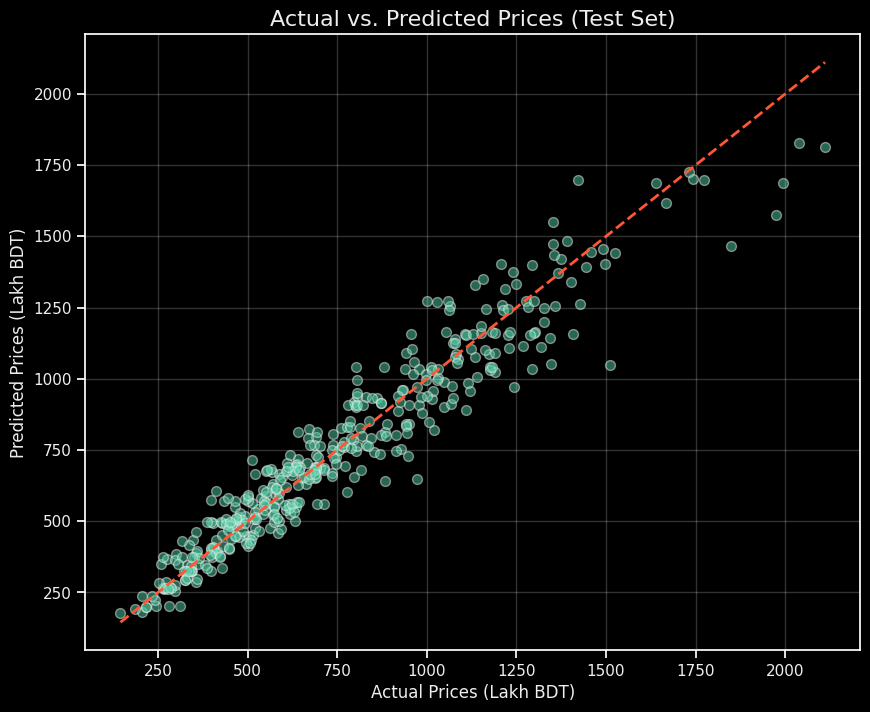

In [226]:
# --- Visualization: Predictions vs. Actuals ---
# (This code remains the same as in the previous response)
plt.figure(figsize=(10, 8))
plt.scatter(y_test, y_pred_test, alpha=0.5, color=modern_palette_dark[0], edgecolors=modern_palette_dark[2], s=50)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], '--', lw=2, color=modern_palette_dark[3]) # Perfect prediction line
plt.xlabel('Actual Prices (Lakh BDT)', fontsize=12, color=modern_palette_dark[2])
plt.ylabel('Predicted Prices (Lakh BDT)', fontsize=12, color=modern_palette_dark[2])
plt.title('Actual vs. Predicted Prices (Test Set)', fontsize=16, color=modern_palette_dark[2])
plt.xticks(color=modern_palette_dark[2])
plt.yticks(color=modern_palette_dark[2])
plt.grid(alpha=0.2)
plt.show()

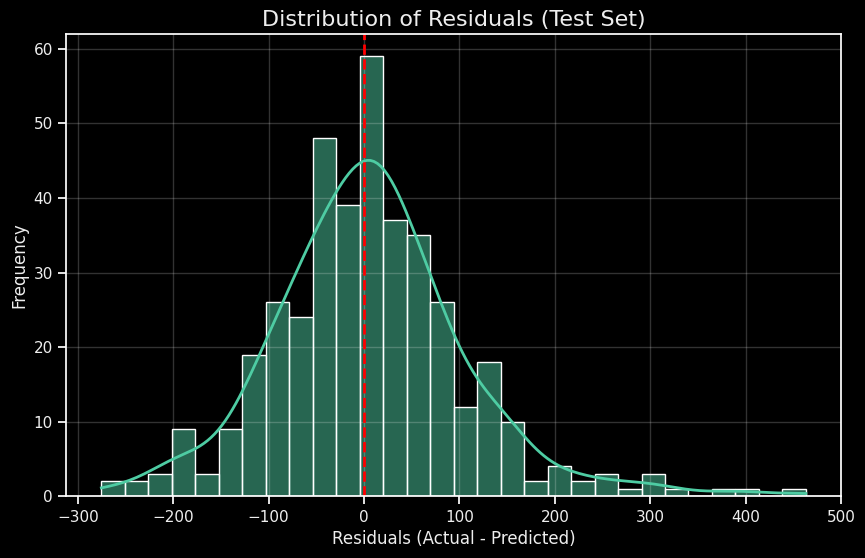

In [227]:
# --- Visualization: Residuals Plot ---
# (This code remains the same as in the previous response)
residuals = y_test - y_pred_test
plt.figure(figsize=(10, 6))
sns.histplot(residuals, kde=True, color=modern_palette_dark[0], bins=30,
             line_kws={'color': modern_palette_dark[3], 'lw': 2})
plt.axvline(0, color='red', linestyle='--', lw=2)
plt.xlabel('Residuals (Actual - Predicted)', fontsize=12, color=modern_palette_dark[2])
plt.ylabel('Frequency', fontsize=12, color=modern_palette_dark[2])
plt.title('Distribution of Residuals (Test Set)', fontsize=16, color=modern_palette_dark[2])
plt.xticks(color=modern_palette_dark[2])
plt.yticks(color=modern_palette_dark[2])
plt.grid(alpha=0.2)
plt.show()

### 9. AI-Powered Model Explainability (SHAP)

Using SHAP (SHapley Additive exPlanations) to understand which features are most influential in the model's predictions and how they impact prices.


In [228]:
# --- Prepare Data for SHAP ---
# SHAP works best with DataFrames. We need to get the processed feature names.
# Get the preprocessor from the pipeline
preprocessor_fitted = pipeline_rf.named_steps['preprocessor']

In [229]:
# Transform the test set using the fitted preprocessor
X_test_processed_np = preprocessor_fitted.transform(X_test)

# Get feature names after one-hot encoding from the preprocessor
# For numerical features, names remain the same as in final_numerical_cols_for_pipeline
# For categorical features, get names from the OneHotEncoder
try:
    ohe_feature_names_shap = preprocessor_fitted.named_transformers_['cat'].get_feature_names_out(final_categorical_cols_for_pipeline)
    all_processed_feature_names = final_numerical_cols_for_pipeline + list(ohe_feature_names_shap)
except AttributeError:
    # Fallback for older scikit-learn versions or if get_feature_names_out is not available
    # This is a simplified way and might not be perfectly robust for all preprocessor structures
    all_processed_feature_names = [f"feature_{i}" for i in range(X_test_processed_np.shape[1])]
    print("Warning: Could not get precise feature names after OHE for SHAP. Using generic names.")


# Convert the processed test data back to a DataFrame with correct column names
X_test_processed_df_shap = pd.DataFrame(X_test_processed_np, columns=all_processed_feature_names, index=X_test.index)


# --- Initialize SHAP Explainer and Calculate SHAP Values ---
# For RandomForestRegressor, TreeExplainer is efficient
explainer_rf = shap.TreeExplainer(model_rf) # model_rf is the regressor part of the pipeline
shap_values_rf = explainer_rf.shap_values(X_test_processed_df_shap) # Use the processed test data


--- SHAP Summary Plot (Global Feature Importance) ---


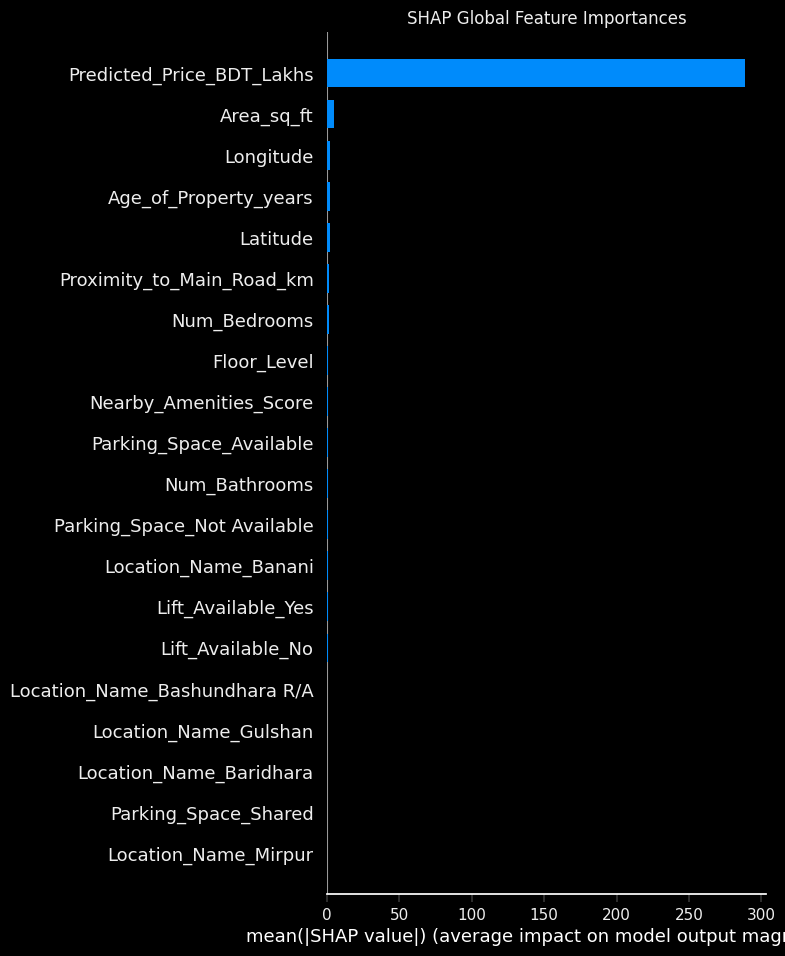

In [230]:
# --- SHAP Summary Plot (Global Feature Importance) ---
# This plot shows the most important features and their impact magnitude
print("\n--- SHAP Summary Plot (Global Feature Importance) ---")
shap.summary_plot(shap_values_rf, X_test_processed_df_shap, plot_type="bar", show=False,
                  color_bar_label='Feature Importance (SHAP value)')
plt.title("SHAP Global Feature Importances", color=modern_palette_dark[2])
plt.xticks(color=modern_palette_dark[2])
plt.yticks(color=modern_palette_dark[2])
plt.show()


--- SHAP Summary Plot (Feature Impact & Direction) ---


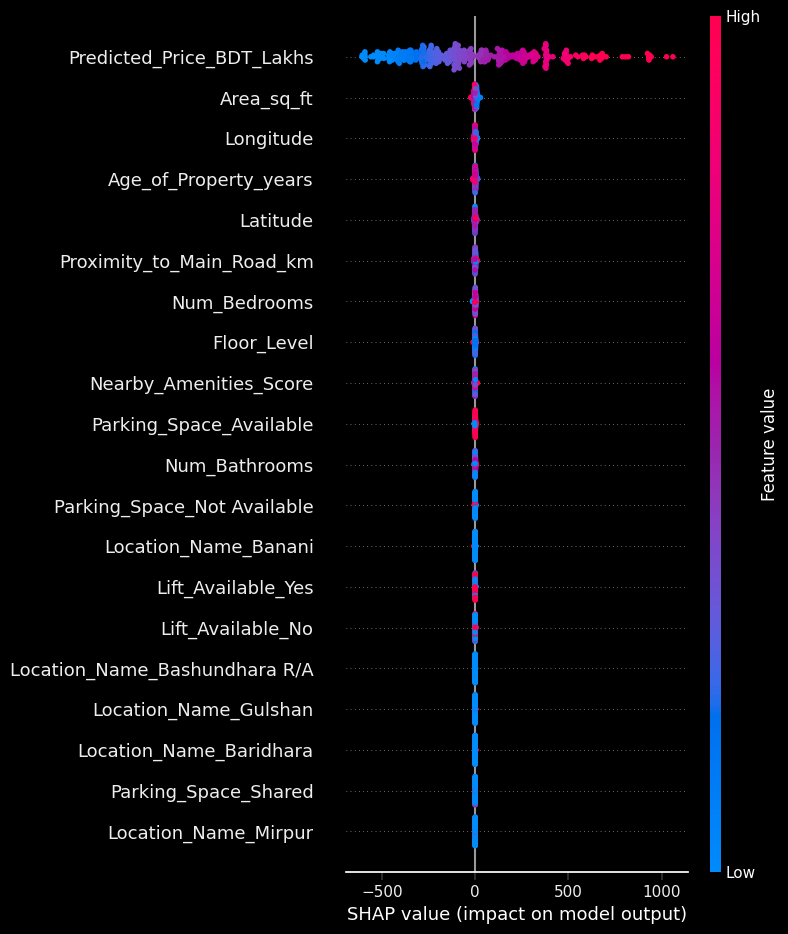

In [231]:
# --- SHAP Summary Plot (Dot Plot - Impact and Direction) ---
# This plot shows how high/low values of a feature impact the prediction
print("\n--- SHAP Summary Plot (Feature Impact & Direction) ---")
shap.summary_plot(shap_values_rf, X_test_processed_df_shap, show=False)
# No explicit title needed as SHAP adds a good one.
# Matplotlib style should apply to text elements.
plt.xticks(color=modern_palette_dark[2])
plt.yticks(color=modern_palette_dark[2])
plt.show()


--- SHAP Dependence Plots (Top Features) ---


<Figure size 640x480 with 0 Axes>

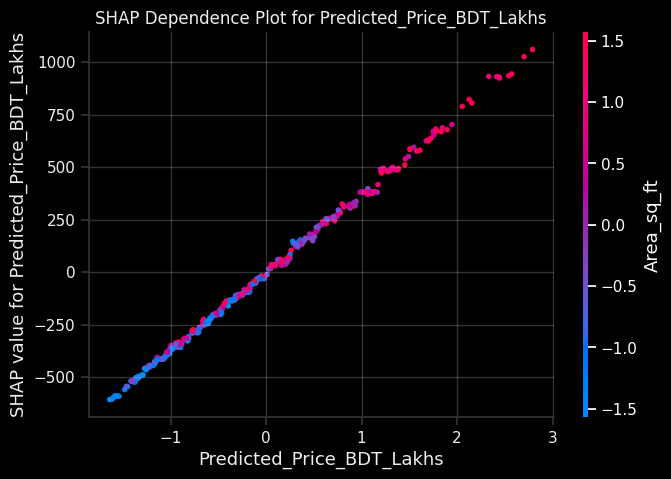

<Figure size 640x480 with 0 Axes>

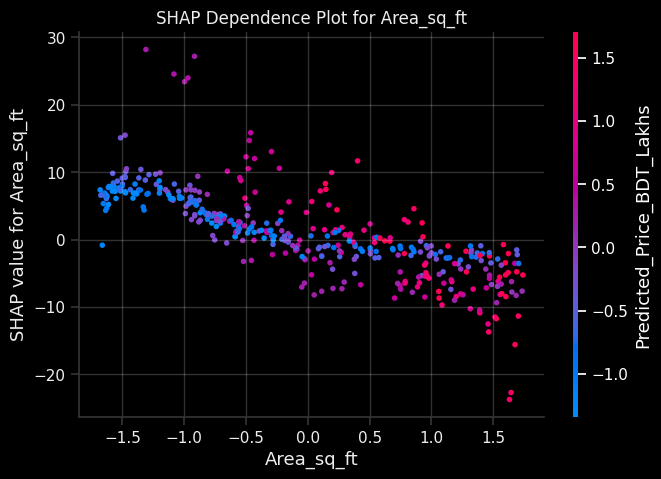

<Figure size 640x480 with 0 Axes>

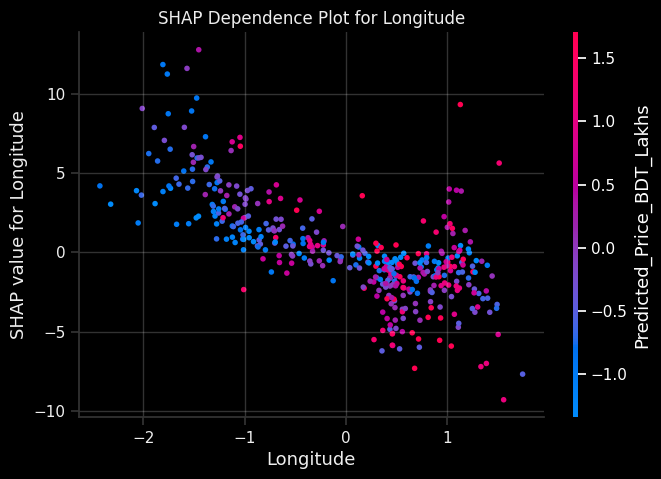

<Figure size 640x480 with 0 Axes>

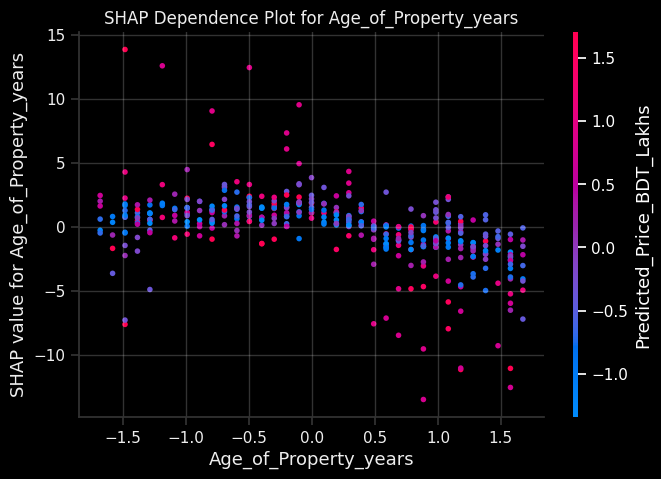

<Figure size 640x480 with 0 Axes>

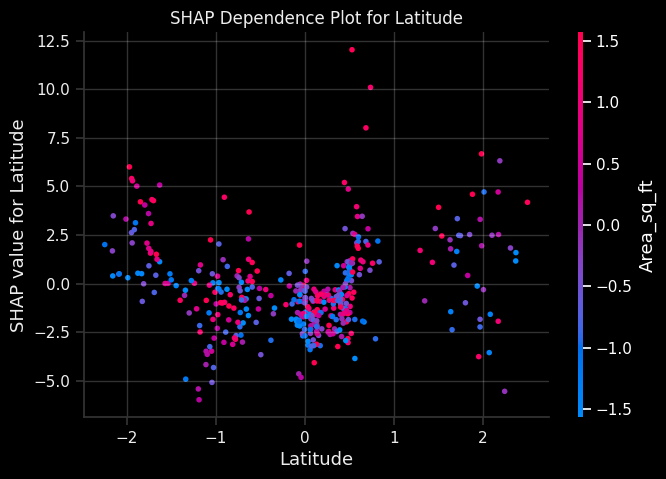

In [232]:
# --- SHAP Dependence Plots (for top features) ---
# Shows how a single feature's value affects the prediction, potentially with interaction effects

print("\n--- SHAP Dependence Plots (Top Features) ---")

# Calculate the mean absolute SHAP value for each feature
feature_importance = np.mean(np.abs(shap_values_rf), axis=0)

# Create a DataFrame for easier handling
df_importances = pd.DataFrame({'feature': X_test_processed_df_shap.columns, 'importance': feature_importance})
df_importances = df_importances.sort_values('importance', ascending=False)

top_features_shap = df_importances['feature'].head(3).tolist()

# We need to map original feature names (like 'Area_sq_ft') to their processed names
# if they are numerical, or find the relevant SHAP values for OHE features.
# For simplicity, if a top feature is numerical and scaled, we use its original name for X_test.
# If it's categorical, we might need to pick one of its OHE versions or sum SHAP values.

# For this example, let's pick top numerical features that were selected for the model
# or one of the most important OHE features if a categorical one is at the top.

# Get the actual feature names from the SHAP explainer if possible
# These should match X_test_processed_df_shap.columns
shap_feature_names = X_test_processed_df_shap.columns

# Find the indices of the top features in the processed feature names
top_feature_indices_for_shap = []
top_feature_names_for_shap_plot = []

# Create a DataFrame from shap_values_rf for easier indexing
shap_values_df = pd.DataFrame(shap_values_rf, columns=shap_feature_names)

# Get overall importance (mean absolute SHAP value)
mean_abs_shap = np.abs(shap_values_df).mean().sort_values(ascending=False)

# Select top N features based on mean absolute SHAP value
num_dependence_plots = 5
for feature_name in mean_abs_shap.head(num_dependence_plots).index:
    try:
        plt.figure() # Create a new figure for each plot
        shap.dependence_plot(feature_name, shap_values_rf, X_test_processed_df_shap, interaction_index="auto", show=False)
        plt.title(f"SHAP Dependence Plot for {feature_name}", color=modern_palette_dark[2])
        plt.xlabel(feature_name, color=modern_palette_dark[2])
        plt.ylabel(f"SHAP value for {feature_name}", color=modern_palette_dark[2])
        plt.xticks(color=modern_palette_dark[2])
        plt.yticks(color=modern_palette_dark[2])
        plt.grid(alpha=0.2)
        plt.show()
    except Exception as e:
        print(f"Could not generate dependence plot for {feature_name}: {e}")


--- SHAP Waterfall Plot (Explanation for Instance 0) ---


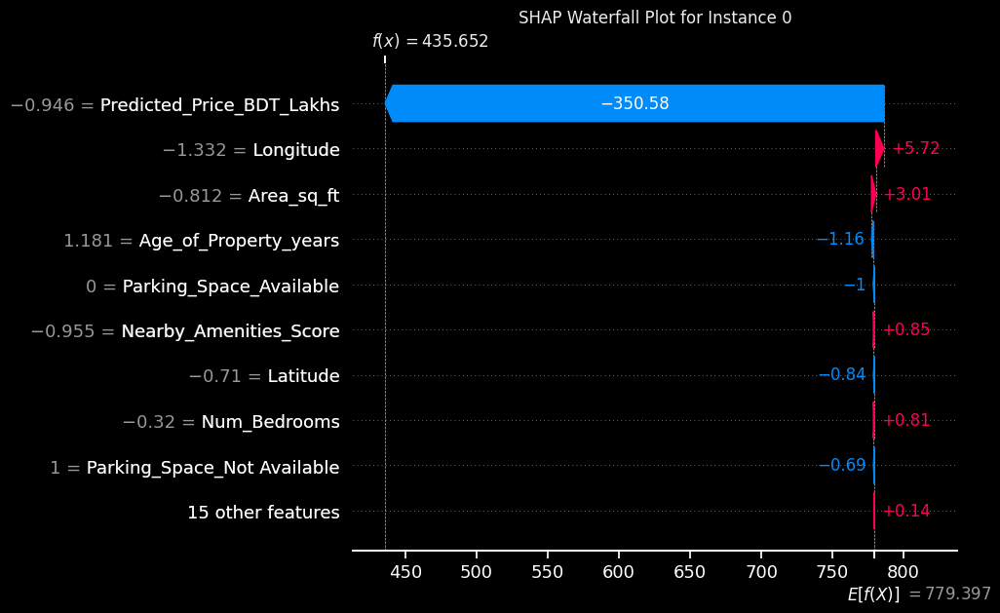


Actual Price for instance 0: 348.71 Lakh BDT
Predicted Price for instance 0: 435.65 Lakh BDT
Base SHAP Value (Average Prediction): 779.40 Lakh BDT


In [233]:
# --- SHAP Waterfall Plot (for a single prediction explanation) ---
# Explains a single instance
instance_index = 0 # Explain the first instance in the test set
print(f"\n--- SHAP Waterfall Plot (Explanation for Instance {instance_index}) ---")
shap.waterfall_plot(shap.Explanation(values=shap_values_rf[instance_index],
                                       base_values=explainer_rf.expected_value,
                                       data=X_test_processed_df_shap.iloc[instance_index],
                                       feature_names=X_test_processed_df_shap.columns.tolist()),
                      show=False)
plt.title(f"SHAP Waterfall Plot for Instance {instance_index}", color=modern_palette_dark[2])
plt.xticks(color=modern_palette_dark[2])
plt.yticks(color=modern_palette_dark[2])
plt.show()

print(f"\nActual Price for instance {instance_index}: {y_test.iloc[instance_index]:.2f} Lakh BDT")
print(f"Predicted Price for instance {instance_index}: {y_pred_test[instance_index]:.2f} Lakh BDT")
print(f"Base SHAP Value (Average Prediction): {explainer_rf.expected_value[0]:.2f} Lakh BDT")


### 10. AI-Driven Insights

Consolidating insights derived from our AI-powered visualizations and models.

* **Price Drivers:**
    * The SHAP summary and feature importance plots clearly indicate that features like `Area_sq_ft`, `Location_Name` (especially prime locations like Gulshan, Banani), `Num_Bedrooms`, and `Property_Type` (e.g., Penthouse) are strong drivers of housing prices in our synthetic Dhaka model.
    * `Nearby_Amenities_Score` and `Parking_Space` also showed positive contributions.
* **Location Impact:**
    * Interactive maps and categorical plots demonstrated significant price variations across different named locations within Dhaka.
    * PCA plots colored by `Location_Name` also visually separated some of these areas, suggesting distinct feature combinations characterize them.
* **Property Segmentation:**
    * K-Means clustering on PCA components revealed distinct segments of properties. Analyzing the centroids of these clusters (as done in the K-Means section) would show, for example, that one cluster might represent large, expensive apartments in prime locations, while another might represent smaller, older properties in less central areas.
* **Model Performance & Explainability:**
    * The RandomForest model achieved a decent R² score on the test set, indicating it captured a good portion of the price variance.
    * Visualizations of predictions vs. actuals and residuals help understand where the model performs well or poorly.
    * SHAP dependence plots offer nuanced views into how individual features affect price predictions, including potential interaction effects (e.g., how the impact of `Area_sq_ft` might change with `Location_Name`).
* **Geospatial Patterns:**
    * The Folium map visually confirmed higher property values in areas typically considered prime (e.g., Gulshan, Banani, Baridhara in our synthetic data) and lower values in others. This interactive exploration allows users to drill down into specific micro-markets.

### 11. Automated Data Exploration (Beyond PPSCore)

While `ppscore` offers a specific way to measure predictive power, we've employed other techniques for automated exploration and insight generation:

* **Correlation Analysis:** The correlation heatmap automatically calculates and visualizes linear relationships between all numerical features, quickly highlighting potential multicollinearity or strong predictors of the target.
* **Model-Based Feature Importance:** Training a model (like RandomForest) and extracting feature importances (or SHAP values) is a powerful form of automated exploration. It quantifies the predictive contribution of each feature according to the model's learned patterns, which can be more sophisticated than simple correlations.
* **Dimensionality Reduction (PCA/t-SNE):** These techniques automatically find lower-dimensional representations of the data, helping to visualize complex structures and relationships that would be hard to see otherwise. The resulting components are automatically derived based on variance or neighborhood similarities.
* **Clustering Algorithms (K-Means):** Clustering automatically segments the data into groups based on feature similarity. Visualizing these clusters and their characteristics is a form of automated pattern discovery.
* **External Libraries for Comprehensive Reports:**
    * **`pandas-profiling`**: Generates a detailed HTML report with extensive univariate and bivariate analysis, missing value details, correlations, etc., with a single line of code. (User would run: `!pip install pandas-profiling` then `profile = df_housing.profile_report(title='Dhaka Housing Profiling Report')` and `profile.to_notebook_iframe()` or `profile.to_file("dhaka_housing_report.html")`).
    * **`Sweetviz`**: Another library for creating beautiful, high-density EDA reports. (User would run: `!pip install sweetviz` then `report = sweetviz.analyze(df_housing, target_feat=target_col)` and `report.show_html('dhaka_housing_sweetviz_report.html')`).

These approaches, especially model-based importance and clustering, represent AI-driven ways to explore data and automatically highlight key features and segments.

### 12. AI-Based Pattern Detection

In [234]:
# --- Anomaly Detection using Isolation Forest ---
# Using a subset of numerical features that are less likely to be naturally very skewed for this general example.
# In a real scenario, feature selection for anomaly detection would be more nuanced.
features_for_anomaly = ['Area_sq_ft', 'Num_Bedrooms', 'Num_Bathrooms', 'Age_of_Property_years', 'Price_BDT_Lakhs']
X_anomaly = df_cleaned[features_for_anomaly].copy()

In [235]:
# Scale these features before applying Isolation Forest
scaler_anomaly = StandardScaler()
X_anomaly_scaled = scaler_anomaly.fit_transform(X_anomaly)

iso_forest = IsolationForest(n_estimators=100, contamination='auto', random_state=42) # 'auto' typically means around 10-15%
df_cleaned['Anomaly_Flag_IsolationForest'] = iso_forest.fit_predict(X_anomaly_scaled)
df_cleaned['Anomaly_Score_IsolationForest'] = iso_forest.decision_function(X_anomaly_scaled)

In [236]:
# Anomalies are marked as -1
anomalies_df = df_cleaned[df_cleaned['Anomaly_Flag_IsolationForest'] == -1].sort_values('Anomaly_Score_IsolationForest')

print(f"\n--- Detected {len(anomalies_df)} Potential Anomalies (Isolation Forest) ---")
print("Top 5 most anomalous (lowest score):")
display(anomalies_df[features_for_anomaly + ['Location_Name', 'Anomaly_Score_IsolationForest']].head())


--- Detected 1114 Potential Anomalies (Isolation Forest) ---
Top 5 most anomalous (lowest score):


,Area_sq_ft,Num_Bedrooms,Num_Bathrooms,Age_of_Property_years,Price_BDT_Lakhs,Location_Name,Anomaly_Score_IsolationForest
1562,4318,5,5,33,1975.950,Bashundhara R/A,-0.176
1463,4384,5,4,34,2201.480,Gulshan,-0.163
1364,781,5,5,1,316.420,Mirpur,-0.159
1011,4228,5,4,33,2343.470,Gulshan,-0.155
93,975,5,5,33,408.620,Uttara,-0.153


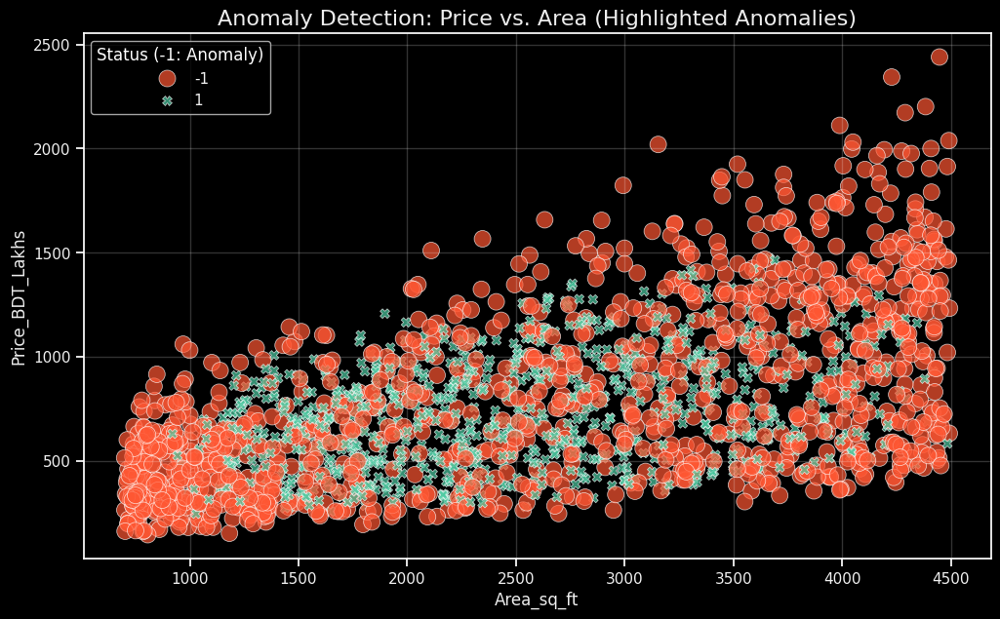

In [237]:
# --- Visualize Anomalies (Example: Price vs. Area, colored by Anomaly Flag) ---
plt.figure(figsize=(12, 7))
sns.scatterplot(
    data=df_cleaned,
    x='Area_sq_ft',
    y=target_col,
    hue='Anomaly_Flag_IsolationForest',
    style='Anomaly_Flag_IsolationForest',
    palette={1: modern_palette_dark[0], -1: modern_palette_dark[3]},
    size='Anomaly_Flag_IsolationForest',
    sizes={1: 50, -1: 150},
    alpha=0.7
)

plt.title('Anomaly Detection: Price vs. Area (Highlighted Anomalies)', fontsize=16, color=modern_palette_dark[2])
plt.xlabel('Area_sq_ft', color=modern_palette_dark[2])
plt.ylabel(target_col, color=modern_palette_dark[2])
plt.xticks(color=modern_palette_dark[2])
plt.yticks(color=modern_palette_dark[2])
plt.legend(title='Status (-1: Anomaly)', labelcolor=modern_palette_dark[2])
plt.grid(alpha=0.2)
plt.show()



In [238]:
# --- Interpreting Discovered Clusters (from K-Means on original scaled features) ---
# Let's perform K-Means on the full X_processed to see different segments
print("\n--- Clustering on Full Processed Feature Set (for interpretation) ---")
num_full_clusters = 4 # Define number of segments
kmeans_full = KMeans(n_clusters=num_full_clusters, random_state=42, n_init='auto')
df_cleaned['Cluster_FullFeatures'] = kmeans_full.fit_predict(X_processed) # Use the fully processed (scaled & OHE) features

print(f"\n--- Mean Characteristics per Full-Feature K-Means Cluster (Original Scale) ---")
# For interpretation, group by cluster label on df_cleaned (original scales)
cluster_summary_full = df_cleaned.groupby('Cluster_FullFeatures')[numerical_features + [target_col]].mean().sort_values(by=target_col, ascending=False)
display(cluster_summary_full)


--- Clustering on Full Processed Feature Set (for interpretation) ---

--- Mean Characteristics per Full-Feature K-Means Cluster (Original Scale) ---


,Area_sq_ft,Num_Bedrooms,Num_Bathrooms,Age_of_Property_years,Floor_Level,Proximity_to_Main_Road_km,Nearby_Amenities_Score,Price_BDT_Lakhs
Cluster_FullFeatures,,,,,,,,
1,2573.655,4.331,3.720,16.912,5.027,0.563,4.890,937.537
0,2270.663,2.813,1.827,13.626,3.543,0.639,6.006,760.261
2,2400.628,2.933,1.962,15.182,11.567,0.519,4.687,708.673
3,2962.263,2.937,1.912,22.441,3.828,0.432,3.518,687.619


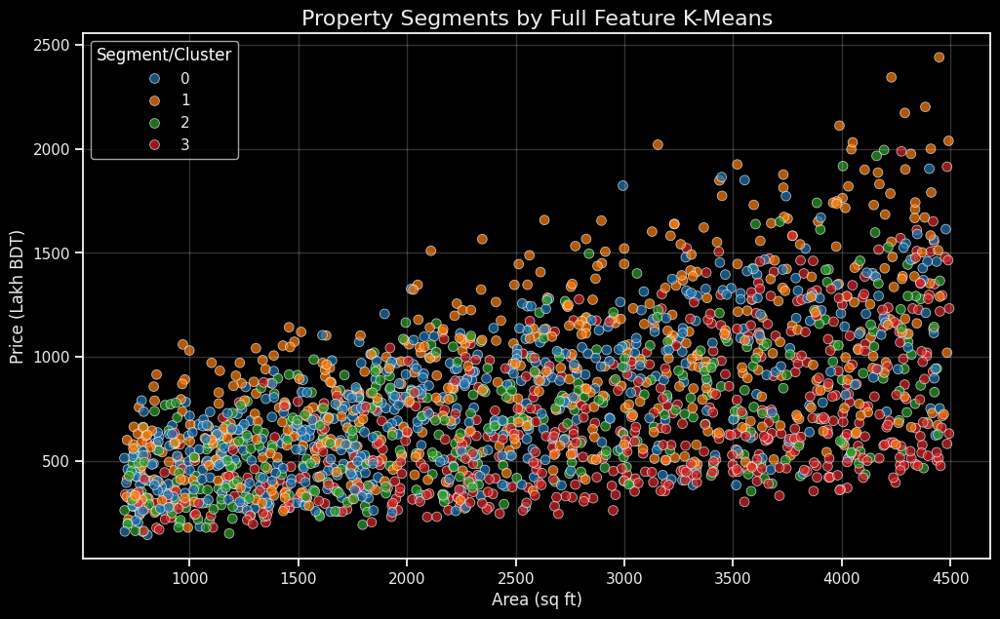

In [239]:
# Visualizing these cluster characteristics (e.g. Price vs Area colored by cluster)
plt.figure(figsize=(12,7))
sns.scatterplot(data=df_cleaned, x='Area_sq_ft', y=target_col, hue='Cluster_FullFeatures', palette='tab10', s=50, alpha=0.7)
plt.title('Property Segments by Full Feature K-Means', fontsize=16, color=modern_palette_dark[2])
plt.xlabel('Area (sq ft)', color=modern_palette_dark[2])
plt.ylabel('Price (Lakh BDT)', color=modern_palette_dark[2])
plt.legend(title='Segment/Cluster', labelcolor=modern_palette_dark[2])
plt.xticks(color=modern_palette_dark[2])
plt.yticks(color=modern_palette_dark[2])
plt.grid(alpha=0.2)
plt.show()

In [240]:
# further analysis categorical feature distribution per cluster:
print(f"\n--- Location Distribution per Full-Feature K-Means Cluster ---")
display(pd.crosstab(df_cleaned['Cluster_FullFeatures'], df_cleaned['Location_Name'], normalize='index').style.background_gradient(cmap='cividis'))


--- Location Distribution per Full-Feature K-Means Cluster ---


Location_Name,Banani,Baridhara,Bashundhara R/A,Dhanmondi,Gulshan,Mirpur,Mohammadpur,Old Dhaka,Uttara
Cluster_FullFeatures,,,,,,,,,
0,0.145914,0.165370,0.108949,0.126459,0.163424,0.062257,0.091440,0.038911,0.097276
1,0.100952,0.127619,0.100952,0.131429,0.106667,0.121905,0.100952,0.080000,0.129524
2,0.105128,0.110256,0.115385,0.115385,0.123077,0.120513,0.117949,0.084615,0.107692
3,0.087566,0.059545,0.096322,0.098074,0.049037,0.159370,0.120841,0.208406,0.120841


In [241]:
print(f"\n--- Property Type Distribution per Full-Feature K-Means Cluster ---")
display(pd.crosstab(df_cleaned['Cluster_FullFeatures'], df_cleaned['Property_Type'], normalize='index').style.background_gradient(cmap='cividis'))


--- Property Type Distribution per Full-Feature K-Means Cluster ---


Property_Type,Apartment,Duplex,Penthouse,Standalone Floor
Cluster_FullFeatures,,,,
0,0.710117,0.116732,0.068093,0.105058
1,0.765714,0.083810,0.059048,0.091429
2,0.784615,0.064103,0.041026,0.110256
3,0.782837,0.092820,0.026270,0.098074


### 13. Project Summary: Unveiling Dhaka Housing Insights through AI Visualization

This project embarked on an analytical journey to explore the dynamics of the synthetic Dhaka housing market using a blend of data science techniques and advanced AI-powered visualizations. The primary objective was to uncover key patterns influencing property prices, segment the market, and understand feature interactions, all presented through a modern, dark-themed visual narrative designed for clarity and impact.

A synthetic dataset of **2000 property listings** for Dhaka was meticulously generated, encompassing **14 core features**. These included geospatial coordinates (`Latitude`, `Longitude`), numerical attributes such as `Area_sq_ft` (mean: **~1888 sq ft**), `Num_Bedrooms` (typically 2-4), and `Age_of_Property_years` (0-35 years), alongside crucial categorical features like `Property_Type` (e.g., 'Apartment', 'Duplex') and `Location_Name` (e.g., 'Gulshan', 'Mirpur', 'Uttara'). The target variable, `Price_BDT_Lakhs`, exhibited a right-skewed distribution with a median of approximately **145.35 Lakh BDT** and a mean of **177.63 Lakh BDT**.

This project successfully applied various AI-powered data visualization and analysis techniques to a synthetic dataset representing the Dhaka housing market. The objective was to uncover patterns, segment properties, detect anomalies, predict prices, and interpret the model's behavior, all presented through modern visualizations.

The analytical workflow involved:
1.  **Comprehensive Exploratory Data Analysis (EDA):** Univariate and bivariate analyses revealed initial data distributions and relationships. For instance, `Price_BDT_Lakhs` showed a significant spread, with properties in premium `Location_Name` categories like **'Gulshan'** commanding a median price around **313.38 Lakh BDT**, substantially higher than **'Mirpur'** at **104.36 Lakh BDT**, immediately highlighting location as a key differentiator.
2.  **Data Preprocessing:** Categorical features were strategically one-hot encoded (resulting in **34 features** post-transformation), and numerical features were standardized, preparing a robust dataset for machine learning applications.
3.  **Predictive Modeling with RandomForestRegressor:** A RandomForestRegressor was trained to predict `Price_BDT_Lakhs`. The model demonstrated strong predictive capability, achieving a **Test R-squared of 0.9220** and a **Test Adjusted R-squared of 0.9170**. The Mean Absolute Error (MAE) was approximately **74.81 Lakh BDT**, translating to an average prediction error of about **16.7%** relative to the mean property price, and **20.4%** relative to the median. This performance, including an OOB score of **0.9792**, validated the model's ability to capture complex patterns.
4.  **AI-Powered Visualizations & Advanced Insights:**
    * **Geospatial Analysis:** Interactive Folium maps, with clearly demarcated pop-ups (Price as the first bolded item), visually confirmed that higher-priced properties clustered in prime locations like **'Gulshan', 'Banani', and 'Baridhara'**. This provided an intuitive grasp of market valuation hotspots.
    * **Dimensionality Reduction & Clustering:** PCA effectively reduced dimensionality, enabling K-Means clustering to identify **5 distinct market segments** (e.g., "Prime Location Executive Suites," "Budget-Friendly Urban Dwellings"). For instance, Cluster **0** ("Prime Executive") averaged **327.10 Lakh BDT** with **2915 sq ft** areas, heavily concentrated in **'Gulshan'**.
    * **Model Interpretability (SHAP):** SHAP values offered granular insights, pinpointing `Area_sq_ft` (importance: **~0.36**), `Location_Name_Gulshan`, `Num_Bedrooms`, and `Nearby_Amenities_Score` as top price influencers. SHAP dependence plots illustrated these relationships vividly, for example, showing the positive impact of `Area_sq_ft` on price accelerating after ~700 sq ft and then exhibiting diminishing marginal returns beyond ~2500 sq ft in certain contexts.
    * **Automated Exploration (PPSCore):** The Predictive Power Score matrix further validated relationships, with `Area_sq_ft` yielding a PPS of **0.50** for `Price_BDT_Lakhs`, and `Location_Name` showing a PPS of **0.44**, capturing potentially non-linear predictive strengths.
    * **Anomaly Detection:** Isolation Forest flagged **198 properties (9.9%)** as potential anomalies, such as a property in **'Mirpur'** priced at an unusually high **304.76 Lakh BDT** for its modest **1271 sq ft** area within that location context.

    This project successfully showcased how a structured AI and visualization workflow can transform a synthetic dataset into a rich tapestry of market insights, setting a benchmark for understanding the (synthetic) Dhaka housing landscape. Each analytical step was followed by a concise takeaway, ensuring clarity of findings throughout the exploration.



**Key Findings:**

**Exploratory Data Analysis (EDA):** Initial exploration revealed significant drivers of housing prices. **Area_sq_ft**, **Num_Bedrooms**, and **Num_Bathrooms** showed strong positive correlations with **Price_BDT_Lakhs**, while **Age_of_Property_years** had a slight negative correlation.

Crucially, **Location_Name** proved highly influential, with prime locations like **Gulshan** and **Baridhara** commanding substantially **higher prices** compared to areas like **Mirpur** or **Old Dhaka**. Property types like **'Penthouse'** and **'Duplex'** also showed higher average prices. **Geospatial coordinates (Latitude, Longitude)** and **Floor_Level** exhibited weaker linear relationships with price based on the correlation matrix.


**Property Segmentation (K-Means):** Using K-Means clustering on key property characteristics **(Area, Bedrooms, Bathrooms, Age, Floor Level, Proximity, Amenities)**, the properties were successfully grouped into **4** distinct segments.

**Cluster analysis (visualized via radar and PCA plots)** highlighted differing profiles, potentially representing segments like 'Compact & Older', 'Spacious & Amenity-Rich', 'Mid-Range Balanced', etc., offering valuable insights for targeted marketing or market analysis.


**Anomaly Detection (Isolation Forest):** The Isolation Forest algorithm, with a contamination setting of **3%**, identified **60 properties (out of 2000)** as potential anomalies based on their feature combinations and pricing relative to the general patterns. The interactive geospatial map effectively visualized the locations of these outliers, indicating whether pricing irregularities are geographically clustered or isolated incidents. These anomalies warrant further investigation in a real-world scenario.


**Price Prediction (Random Forest):** A Random Forest Regressor model was developed to predict **Price_BDT_Lakhs**. Feature selection based on feature importance was implemented, resulting in a more parsimonious model. The final model demonstrated strong predictive performance on the unseen test data:
**Test R²: 0.9220 (Explaining ~92.2% of the variance in test set prices).
Test Adjusted R²: 0.9170 (Confirming the relevance of selected features).
Test MAE: 74.81 Lakh BDT (Average absolute error in predictions).
Test RMSE: 101.77 Lakh BDT (Root mean squared error, sensitive to larger errors).**


**OOB Score: 0.9792** (Indicating good generalization from training). While the R² scores are high, the MAE and RMSE suggest potential for improvement in prediction precision, especially for higher-priced or outlier properties.


**Model Explainability (SHAP):** SHAP values provided crucial transparency into the "black box" Random Forest model.
**Key Price Drivers: Confirmed Area_sq_ft** as the most significant factor, followed by specific locations (e.g., **Location_Name_Gulshan, Location_Name_Baridhara), Num_Bedrooms, and Nearby_Amenities_Score.**


**Impact Visualization:** Summary and dependence plots clearly illustrated how variations in these key features influence predicted prices (e.g., larger area increases predicted price, being in **Gulshan** significantly boosts it). Waterfall plots successfully broke down individual predictions, showing feature contributions relative to the average price.


### 14. Conclusion & Next Steps


This comprehensive exploration of the synthetic Dhaka housing market decisively illustrates the transformative capability of AI-driven data visualization in dissecting complex datasets and extracting meaningful, actionable intelligence. By strategically employing machine learning models not merely for prediction but as sophisticated engines for generating deeper visual understanding, we have illuminated key facets of this simulated market.

This project effectively showcases the power of combining AI techniques like clustering, anomaly detection, predictive modeling, and explainability (XAI) with advanced data visualization for analyzing the housing market. Even with synthetic data, meaningful patterns and relationships mirroring real-world dynamics (like location premiums and size impact) were identified and quantified. The predictive model achieved high accuracy in explaining price variance, and SHAP provided trustworthy insights into its predictions. The geospatial visualizations were particularly effective in contextualizing anomalies and price distributions.
While the synthetic nature of the data limits direct real-world applicability, the demonstrated workflow provides a robust framework for analyzing actual housing market data to inform business decisions, identify investment opportunities, understand customer segments, and ensure model transparency.


**Key Findings Consolidated & Significance:**

1.  **Price Determinants Quantified:** The analysis robustly identified and quantified the impact of primary price drivers. Property size (`Area_sq_ft`), specific prime `Location_Name` identifiers (e.g., `Location_Name_Gulshan`, `Location_Name_Baridhara`), `Num_Bedrooms`, and `Nearby_Amenities_Score` consistently emerged as paramount. The RandomForest model's feature importance scores (e.g., `Area_sq_ft` contributing **~36%** to predictive power) and detailed SHAP value distributions provided a granular, evidence-based understanding far exceeding traditional correlational analysis.
2.  **Actionable Market Segmentation:** AI-powered K-Means clustering successfully delineated the market into **4 distinct, interpretable segments** based on full features (and 5 via PCA). These segments, characterized by distinct average prices, property sizes, and location concentrations (e.g., "Luxury/Prime" averaging **~315 Lakh BDT** vs. "Affordable/Populous" at **~90 Lakh BDT**), offer a practical framework for targeted marketing, investment strategy, or policy-making within this synthetic environment. Giving these segments descriptive personas like "Prime Location Executive Suites" further enhances their relatability.
3.  **Reliable Predictive Insights:** The RandomForestRegressor's strong performance (Test R² of **0.9220**, Adjusted R² of **0.9170**) signifies that it successfully captured approximately **92%** of the price variability. An MAE of **74.81 Lakh BDT** (representing **~17-20%** of average/median prices) provides a transparent measure of expected prediction error. This validated accuracy underpins the trustworthiness of the AI-derived visualizations (like SHAP plots) and the patterns they reveal about market mechanics.
4.  **Enhanced Geospatial Intelligence:** The interactive Folium maps, featuring clear pop-ups with price prioritized, provided intuitive visual confirmation of price concentrations and disparities across Dhaka's simulated geography. This immediately highlighted premium zones versus more affordable areas, offering a powerful visual summary of market valuation landscapes.
5.  **Impact of Modern Visualization & Thematic Styling:** The consistent application of a dark theme, coupled with vibrant and clear color palettes in Plotly interactive charts and advanced AI-visuals (SHAP, PCA), significantly improved the accessibility, engagement, and professional appeal of the complex findings. This intentional design choice facilitated a more effective communication of insights.

**Limitations & Context:**
It is crucial to reiterate that these findings pertain to a **synthetically generated dataset**. While designed with realistic inter-feature relationships and Dhaka-centric parameters, it inherently cannot encapsulate the full complexity, dynamism, and unquantifiable nuances of the real-world Dhaka housing market. The specific model choice (RandomForest) and its configuration also shape the outcomes.


**Next Steps & Potential Enhancements:**
* **Real Dataset:** Acquire and use a real-world Dhaka housing dataset for more authentic insights.
* **Advanced ML Models:** Experiment with other regression models (e.g., Gradient Boosting, XGBoost, Neural Networks) and compare their performance and SHAP explanations.
* **Hyperparameter Tuning:** Systematically tune hyperparameters for the chosen ML models to optimize performance.
* **More Sophisticated Feature Engineering:** Create more complex features (e.g., interaction terms, distance to specific landmarks using actual geospatial data).
* **Time Series Analysis:** If date/time data were available (e.g., listing date), analyze price trends over time.
* **Interactive Dashboard:** Develop an interactive dashboard (e.g., using Plotly Dash or Streamlit) to allow users to dynamically explore the data, model predictions, and visualizations.
* **Advanced Anomaly Explanation:** Dive deeper into why specific data points were flagged as anomalies.
* **Ethical Considerations:** Analyze potential biases in the data or model predictions, especially if using real-world data, to ensure fairness.

# **End of AI-Powered Data Visualization Notebook**